<a href="https://colab.research.google.com/github/Basel-Amr/Sprints-AI-and-ML-Bootcamp/blob/main/E-Commerce-Analytics-Task/notebooks/Capstone_Project_E_commerce_Analytics_Module.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

**Capstone Project 01 : E-commerce Sales Analysis**

**Team 1** - Sprints Bootcamp

**Team Members:**
  * Menna Mohamed
  * Dina Fakhry
  * Abanoub Younan
  * Karen Emad
  * Basel Amr
  * Ahmed Hesham

**Date: 2024-12-27**

**Table of Content**

 1. Introduction
 2. Setting Up the Environment
 3. Visualization using ProfileReport
 4. Task 1: Data Cleaning
 5. Task 2: Exploratory Data Analysis (EDA)
 6. Task 3: Time Series Analysis
 7. Task 4: RFM Analysis (Customer Segmentation)
 8. Task 5: Product Category Analysis
 9. Task 6: Geographical Analysis
 10. Task 7: Customer Behavior Analysis
 11. Task 8: Moving Average Forecast
 12. Task 9: Summary Dashboard Creation
 13. Task 10: Optimize Data Processing
 14. Task 11: Report Generation
 15. Conclusion
 16. References

# 📝 **1. Introduction & Objective**
**Overview:**

This project focuses on analyzing an e-commerce sales dataset to extract meaningful insights, optimize business strategies, and improve customer engagement. The analysis will cover data cleaning, customer segmentation, time-series forecasting, and performance visualization.

**Objectives:**
- Clean and preprocess raw data for accurate analysis.
- Perform descriptive and exploratory data analysis (EDA) to uncover trends.
- Segment customers using RFM analysis to identify key customer groups.
- Analyze sales trends across different time periods.
- Forecast future sales using moving average techniques.
- Present insights through interactive dashboards and visualizations.

**Dataset Description:**

The dataset includes transactional data from an online retail store. Key columns include:
- `InvoiceNo`: Unique invoice number for each transaction.
- `StockCode`: Product identifier.
- `Description`: Product description.
- `Quantity`: Number of units purchased.
- `InvoiceDate`: Date and time of purchase.
- `UnitPrice`: Price per unit of product.
- `CustomerID`: Unique customer identifier.
- `Country`: Country where the purchase was made.

# 🚀 **2. Setting Up the Environment**

## 2.1 Import Necessary libraries

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import datetime as dt
import warnings
import time
import plotly.express as px
import plotly.graph_objects as go
import pandas as pd


try:
  import pygwalker as pyg
except:
  print(f"Couldn't find pygwalker.....Trying to install it")
  !pip install pygwalker
  print("✅ pygwalker installed successfully")
  import pygwalker as pyg
from plotly.subplots import make_subplots
from datetime import datetime, timedelta
import seaborn as sns


from pathlib import Path
import os
import sys

try:
  from ydata_profiling import ProfileReport
except:
  print(f"Couldn't find ydata-profiling.....Trying to install it")
  !pip install ydata-profiling
  print("✅ ydata_profilling installed successfully")
  from ydata_profiling import ProfileReport

warnings.filterwarnings('ignore')

Couldn't find pygwalker.....Trying to install it
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.5/4.5 MB 11.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 956.2/956.2 kB 44.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 100.2/100.2 kB 8.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 213.7/213.7 kB 15.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 66.4/66.4 kB 5.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.2/2.2 MB 8.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 55.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 727.4/727.4 kB 46.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 6.6/6.6 MB 17.3 MB/s eta 0:00:00
✅ pygwalker installed successfully
Couldn't find ydata-profiling.....Trying to install it
  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 390.9/390.9 kB 7.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━

In [ ]:
# to get packages initially installed in colab or in other word, the colab environment
!pip3 freeze > requirements.txt

## 2.2 Load the Dataset

In [ ]:
# Load the dataset
try:
    # Check if running on Google Colab
    import google.colab
    from google.colab import drive

    print("Running on Google Colab. Mounting Google Drive...")

    # Mount Google Drive
    drive.mount('/content/drive')

    # Define the file path in Google Drive
    file_path = '/content/drive/My Drive/E-commerce-dataset/data.csv'

    E_Commerce_df = pd.read_csv(file_path, encoding='ISO-8859-1')
    print("✅ Dataset loaded successfully.")

except ImportError:
    print("Not running on Google Colab.")
    E_Commerce_df = pd.read_csv('data.csv', encoding='ISO-8859-1')
    print("✅ Dataset loaded successfully.")


Running on Google Colab. Mounting Google Drive...
Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
✅ Dataset loaded successfully.


# 📊 **3. Visualization using `ProfileReport`**

In [ ]:
profile = ProfileReport(E_Commerce_df, title="E-Commerce Sales Dataset")
print("✅ ProfileReport was made successfully.")

✅ ProfileReport was made successfully.


In [ ]:
# Save to JSON file
profile.to_file("report_json.json")
print("✅ report_json.json was saved successfully.")

# Save to html file
profile.to_file("report_html.html")
print("✅ report_html.html was saved successfully.")

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Render JSON:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

✅ report_json.json was saved successfully.


Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

✅ report_html.html was saved successfully.


In [ ]:
profile.to_notebook_iframe()

##3.1 Observation from the E-commerce Sales DataSet
1.  **Dataset Overview**
  * `Number Of Variables`: 8
  * `Numeber Of Observations`: 100,247
  * `Missing Cells`: 35,236 (4.4%)
  * `Duplicate rows`: 849 (0.8%)

2.  **Variable Types**
  * `Text Variables` : 3  (Description & StockCode & InvoiceNo)
  * `Numeric Variables`: 3 (Quantity & UnitPrice & CustomerID)
  * `DateTime Variables` : 1  (InvoiceDate)
  * `Categorical Variables`: 1  (Country)

3.  **Data Quality Alerts**
  * `Description` : has 299 missing records (0.3%)
  * `CustomerID` : has 34,935 missing records (34.8%)
  * `UnitPrice`: has 1 missing records (<0.1%)
  * `Country`   : has 1 missing records (<0.1%)

  * `Country` : is **highly inbalanced** with 92,591 (86.2%) of the entires concentrated in one country.
  * `UnitPrice` : is **highly skewed** (γ1 = 113.1442141)
  * Dataset has 849 (0.8%) `duplicate rows`


  

## **3.2 Insights from the DataSet**
  1.  **Customer Segmentation**
      * A very large number of customers **do not** have a recorded `CustomerID`
      * The **majority** of sales seems to be concentrated in a few countries, indicating potential market dependency
  2.  **Product Pricing**
      * `UnitPrice` shows significant skewness, suggesting outliers such as abnormally high or low prices that could affect sales trends analysis
  3.  **Data Duplication**
      * Duplicate rows indicates possible redundancy or errors in each records, which may distort revenue and sales analysis

# 📌 **4. Task 1 : Early Discovery and Data Preprocessing & Cleaning**
**Description**: Clean and preprocess the dataset by handling missing values, formatting data types, and removing incorrect records.

**Requirments**:
- Handle missing values in `CustomerID`
- Convert `InvoiceDate` to DateTime type
- Remove rows with negative `Quantity` or UnitPrice
- Create a `TotalPrice` column

**Responsible:** Abanoub Younan

### **Data Preprocessing Checklist**

---

#### 1. Data Understanding
- **Define Objective**: What problem are we solving? What insights or predictions are we aiming for?
- **Explore Dataset**: Look at column names, data types, sample values, and size.

---

#### 2. Data Quality Assessment and Cleaning:
- **Duplicates**:
 - Identify duplicate rows.
 - Drop exact or fuzzy duplicates as appropriate.
- **Incorrect Data**:
 - Identify invalid entries (e.g., negative ages, impossible values) and Remove or Correct them.
- **Outliers**:
 - Detect outliers using statistical methods (e.g., IQR, Z-score).
 - Handle Outliers:
   - Cap or floor extreme values.
   - Transform data (e.g., log scaling).
   - Remove outliers if they are errors or irrelevant.
- **Missing Values**:
 - Check for null or missing values in the dataset.
 - Handle Missing Values:
   - Fill (e.g., mean, median, mode, interpolation).
   - Drop rows/columns (if justified).
   - Use prediction/imputation models for filling.
- **Inconsistent Formats**:
  - Look for inconsistencies in text, date, or numerical formats.
  - Fix Inconsistencies:
    - Standardize text (e.g., lowercase, strip whitespaces).
    - Unify date formats.
    - Remove special characters in categorical data if needed.

---

#### 3. Feature Engineering
- **Transform Features**:
  - Apply scaling (e.g., MinMaxScaler, StandardScaler).
  - Create new features from existing ones (e.g., TotalPrice → UnitPrice * Quantity).
  
---

#### 4. Save Preprocessed Data
- **Save Cleaned Dataset**: Store the final dataset in a structured format (e.g., CSV, Parquet).
- **Document Changes**: Keep a log of preprocessing steps for reproducibility.


## **4.1 Data Understanding**

In [ ]:
E_Commerce_df.head()

,InvoiceNo,StockCode,Description,Quantity,InvoiceDate,UnitPrice,CustomerID,Country
0,536365,85123A,WHITE HANGING HEART T-LIGHT HOLDER,6,12/1/2010 8:26,2.55,17850.0,United Kingdom
1,536365,71053,WHITE METAL LANTERN,6,12/1/2010 8:26,3.39,17850.0,United Kingdom
2,536365,84406B,CREAM CUPID HEARTS COAT HANGER,8,12/1/2010 8:26,2.75,17850.0,United Kingdom
3,536365,84029G,KNITTED UNION FLAG HOT WATER BOTTLE,6,12/1/2010 8:26,3.39,17850.0,United Kingdom
4,536365,84029E,RED WOOLLY HOTTIE WHITE HEART.,6,12/1/2010 8:26,3.39,17850.0,United Kingdom


In [ ]:
E_Commerce_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 541909 entries, 0 to 541908
Data columns (total 8 columns):
 #   Column       Non-Null Count   Dtype  
---  ------       --------------   -----  
 0   InvoiceNo    541909 non-null  object 
 1   StockCode    541909 non-null  object 
 2   Description  540455 non-null  object 
 3   Quantity     541909 non-null  int64  
 4   InvoiceDate  541909 non-null  object 
 5   UnitPrice    541909 non-null  float64
 6   CustomerID   406829 non-null  float64
 7   Country      541909 non-null  object 
dtypes: float64(2), int64(1), object(5)
memory usage: 33.1+ MB


- We have 8 columns and 541909 records.
- We have missing data in CustomerID, and Description columns.
- The InvoiceNo should be number, Why its datatype is an object?
- The InvoiceDate Column haven't any null values but It considered as a Object, not as a datetime, Let us convert it to help us in our analysis!

In [ ]:
# Convert InvoiceDate Column to datetime:
E_Commerce_df['InvoiceDate'] = pd.to_datetime(E_Commerce_df['InvoiceDate'])
print(E_Commerce_df['InvoiceDate'].dtype)

datetime64[ns]


In [ ]:
E_Commerce_df.describe()

,Quantity,InvoiceDate,UnitPrice,CustomerID
count,541909.000000,541909,541909.000000,406829.000000
mean,9.552250,2011-07-04 13:34:57.156386048,4.611114,15287.690570
min,-80995.000000,2010-12-01 08:26:00,-11062.060000,12346.000000
25%,1.000000,2011-03-28 11:34:00,1.250000,13953.000000
50%,3.000000,2011-07-19 17:17:00,2.080000,15152.000000
75%,10.000000,2011-10-19 11:27:00,4.130000,16791.000000
max,80995.000000,2011-12-09 12:50:00,38970.000000,18287.000000
std,218.081158,NaN,96.759853,1713.600303


- We have negative numbers in Quantity and UnitPrice.
- And there are big difference between mean and median values in Quantity and UnitPrice and That is an identifier for an outliers values.

## **4.2 Data Quality Assessment**

### 4.2.1 **Duplicates:**
**Identify and Handle duplicate rows.**

In [ ]:
print('Number of dublicated rows:\n', E_Commerce_df.duplicated().sum(), '\nPercentage of of dublicated rows:\n',
      f"{(E_Commerce_df.duplicated().sum()/E_Commerce_df.shape[0])*100:.2f}%")

Number of dublicated rows:
 5268 
Percentage of of dublicated rows:
 0.97%


The Dublicated rows is about 1% of our data,

In [ ]:
# Identify duplicate rows and count occurrences
duplicate_counts = E_Commerce_df.value_counts().reset_index(name='count')

# Filter rows that are repeated (count > 1)
repeated_rows = duplicate_counts[duplicate_counts['count'] > 1]

# Display the top 5 most repeated rows
top_5_repeated = repeated_rows.head(5)

print("Top 5 Most Repeated Rows:")
display(repeated_rows.head(5))

# Keep only one records for the duplicates
E_Commerce_df = E_Commerce_df.drop_duplicates(keep='first')
print("✅ Duplicates were removed successfully.")
# Print the new size of the dataSet
print(f"New size of the dataSet: {E_Commerce_df.shape}")

Top 5 Most Repeated Rows:


,InvoiceNo,StockCode,Description,Quantity,InvoiceDate,UnitPrice,CustomerID,Country,count
0,555524,22698,PINK REGENCY TEACUP AND SAUCER,1,2011-06-05 11:37:00,2.95,16923.0,United Kingdom,20
1,555524,22697,GREEN REGENCY TEACUP AND SAUCER,1,2011-06-05 11:37:00,2.95,16923.0,United Kingdom,12
2,572861,22775,PURPLE DRAWERKNOB ACRYLIC EDWARDIAN,12,2011-10-26 12:46:00,1.25,14102.0,United Kingdom,8
3,572344,M,Manual,48,2011-10-24 10:43:00,1.50,14607.0,United Kingdom,6
4,578289,23395,BELLE JARDINIERE CUSHION COVER,1,2011-11-23 14:07:00,3.75,17841.0,United Kingdom,6


✅ Duplicates were removed successfully.
New size of the dataSet: (536641, 8)


### 4.2.2 **Incorrect Data**:
**Identify invalid entries (e.g., negative ages, impossible values) and Remove or Correct them.**

In [ ]:
E_Commerce_df.describe()

,Quantity,InvoiceDate,UnitPrice,CustomerID
count,536641.000000,536641,536641.000000,401604.000000
mean,9.620029,2011-07-04 08:57:06.087421952,4.632656,15281.160818
min,-80995.000000,2010-12-01 08:26:00,-11062.060000,12346.000000
25%,1.000000,2011-03-28 10:52:00,1.250000,13939.000000
50%,3.000000,2011-07-19 14:04:00,2.080000,15145.000000
75%,10.000000,2011-10-18 17:05:00,4.130000,16784.000000
max,80995.000000,2011-12-09 12:50:00,38970.000000,18287.000000
std,219.130156,NaN,97.233118,1714.006089


There are negative values in Quantity and UnitPrice columns, and That's shouldn't be right, So we need to Investigate it more.

In [ ]:
negative_unitprice_df = E_Commerce_df[E_Commerce_df['UnitPrice'] < 0].copy().reset_index()

negative_unitprice_df.head()

,index,InvoiceNo,StockCode,Description,Quantity,InvoiceDate,UnitPrice,CustomerID,Country
0,299983,A563186,B,Adjust bad debt,1,2011-08-12 14:51:00,-11062.06,NaN,United Kingdom
1,299984,A563187,B,Adjust bad debt,1,2011-08-12 14:52:00,-11062.06,NaN,United Kingdom


There are only 2 rows with negative UnitPrice, and from the Description maybe this negative values to handle debt on the system.
So we can remove these rows safely.

In [ ]:
E_Commerce_df = E_Commerce_df[E_Commerce_df['UnitPrice'] >= 0]

In [ ]:
# Check the summary statistics after removing the negative UnitPrice
E_Commerce_df.describe()

,Quantity,InvoiceDate,UnitPrice,CustomerID
count,536639.000000,536639,536639.000000,401604.000000
mean,9.620061,2011-07-04 08:56:53.450010880,4.673900,15281.160818
min,-80995.000000,2010-12-01 08:26:00,0.000000,12346.000000
25%,1.000000,2011-03-28 10:52:00,1.250000,13939.000000
50%,3.000000,2011-07-19 14:04:00,2.080000,15145.000000
75%,10.000000,2011-10-18 17:05:00,4.130000,16784.000000
max,80995.000000,2011-12-09 12:50:00,38970.000000,18287.000000
std,219.130564,NaN,94.857114,1714.006089


**Now we have records with 0 in UnitPrice, Let us discover it further**

In [ ]:
zero_unitprice_df = E_Commerce_df[E_Commerce_df['UnitPrice'] == 0].copy().reset_index()

zero_unitprice_df.head()

,index,InvoiceNo,StockCode,Description,Quantity,InvoiceDate,UnitPrice,CustomerID,Country
0,622,536414,22139,NaN,56,2010-12-01 11:52:00,0.0,NaN,United Kingdom
1,1970,536545,21134,NaN,1,2010-12-01 14:32:00,0.0,NaN,United Kingdom
2,1971,536546,22145,NaN,1,2010-12-01 14:33:00,0.0,NaN,United Kingdom
3,1972,536547,37509,NaN,1,2010-12-01 14:33:00,0.0,NaN,United Kingdom
4,1987,536549,85226A,NaN,1,2010-12-01 14:34:00,0.0,NaN,United Kingdom


In [ ]:
print('Number of zero unitprice records:', zero_unitprice_df.shape[0])
print(f'Percentage of zero unitprice records: {(zero_unitprice_df.shape[0]/ E_Commerce_df.shape[0])*100:.2f}%')

Number of zero unitprice records: 2510
Percentage of zero unitprice records: 0.47%


In [ ]:
zero_unitprice_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2510 entries, 0 to 2509
Data columns (total 9 columns):
 #   Column       Non-Null Count  Dtype         
---  ------       --------------  -----         
 0   index        2510 non-null   int64         
 1   InvoiceNo    2510 non-null   object        
 2   StockCode    2510 non-null   object        
 3   Description  1056 non-null   object        
 4   Quantity     2510 non-null   int64         
 5   InvoiceDate  2510 non-null   datetime64[ns]
 6   UnitPrice    2510 non-null   float64       
 7   CustomerID   40 non-null     float64       
 8   Country      2510 non-null   object        
dtypes: datetime64[ns](1), float64(2), int64(2), object(4)
memory usage: 176.6+ KB


40 records only have customer ID, and more than the half of the records have null values in the Description column.

In [ ]:
display(zero_unitprice_df.describe())
display(E_Commerce_df[E_Commerce_df['UnitPrice']>0].describe())

,index,Quantity,InvoiceDate,UnitPrice,CustomerID
count,2510.000000,2510.000000,2510,2510.0,40.000000
mean,232632.939442,-53.529880,2011-06-07 00:19:48.023904256,0.0,14217.225000
min,622.000000,-9600.000000,2010-12-01 11:52:00,0.0,12415.000000
25%,124008.250000,-32.750000,2011-03-18 11:02:00,0.0,12722.750000
50%,201754.500000,-2.000000,2011-05-23 15:30:30,0.0,13985.000000
75%,347978.750000,3.000000,2011-09-19 16:58:45,0.0,15225.500000
max,538919.000000,12540.000000,2011-12-08 15:24:00,0.0,18059.000000
std,146159.913325,540.739276,NaN,0.0,1676.321178


,Quantity,InvoiceDate,UnitPrice,CustomerID
count,534129.000000,534129,534129.000000,401564.000000
mean,9.916818,2011-07-04 12:02:01.631403776,4.695864,15281.266797
min,-80995.000000,2010-12-01 08:26:00,0.001000,12346.000000
25%,1.000000,2011-03-28 11:36:00,1.250000,13939.000000
50%,3.000000,2011-07-19 15:55:00,2.100000,15145.000000
75%,10.000000,2011-10-18 17:10:00,4.130000,16788.000000
max,80995.000000,2011-12-09 12:50:00,38970.000000,18287.000000
std,216.452113,NaN,95.079189,1713.978947


- The Distrbution of the Quantity column has a big difference between records with zero value in UnitPrice and between the records with positive values in UnitPrice.
- More than the half of the Quantity values of the records with zeros in UnitPrice are negative numbers.
- There aren't a big difference between the two InvoiceDate distrbutions.

- So, We can safely assume these rows with zeros in the UnitPrice are errors or Gifts, and we can remove them without skewing our data.

In [ ]:
# Removing Rows with zeros in UnitPrice.
E_Commerce_df = E_Commerce_df[E_Commerce_df['UnitPrice']>0]
E_Commerce_df.describe()

,Quantity,InvoiceDate,UnitPrice,CustomerID
count,534129.000000,534129,534129.000000,401564.000000
mean,9.916818,2011-07-04 12:02:01.631403776,4.695864,15281.266797
min,-80995.000000,2010-12-01 08:26:00,0.001000,12346.000000
25%,1.000000,2011-03-28 11:36:00,1.250000,13939.000000
50%,3.000000,2011-07-19 15:55:00,2.100000,15145.000000
75%,10.000000,2011-10-18 17:10:00,4.130000,16788.000000
max,80995.000000,2011-12-09 12:50:00,38970.000000,18287.000000
std,216.452113,NaN,95.079189,1713.978947


- Okay, Now we have a very small value in min UnitPrice, But we will take care of it, when handling the outliers.
- Okay we still have a negative values in Quantity Columns, Let us take a closer look!

In [ ]:
negative_quantity_df = E_Commerce_df[E_Commerce_df['Quantity'] < 0].copy().reset_index()
negative_quantity_df.head()

,index,InvoiceNo,StockCode,Description,Quantity,InvoiceDate,UnitPrice,CustomerID,Country
0,141,C536379,D,Discount,-1,2010-12-01 09:41:00,27.50,14527.0,United Kingdom
1,154,C536383,35004C,SET OF 3 COLOURED FLYING DUCKS,-1,2010-12-01 09:49:00,4.65,15311.0,United Kingdom
2,235,C536391,22556,PLASTERS IN TIN CIRCUS PARADE,-12,2010-12-01 10:24:00,1.65,17548.0,United Kingdom
3,236,C536391,21984,PACK OF 12 PINK PAISLEY TISSUES,-24,2010-12-01 10:24:00,0.29,17548.0,United Kingdom
4,237,C536391,21983,PACK OF 12 BLUE PAISLEY TISSUES,-24,2010-12-01 10:24:00,0.29,17548.0,United Kingdom


Wait!!
The all InvoiceNo from these 5 rows start with C,
It could mean It's a cancelled order!
Let us check it more

In [ ]:
# Get the Number of InvoiceNo start with 'C' from the records with negative quantities
negative_quantity_df[negative_quantity_df['InvoiceNo'].str.startswith('C')].head()

,index,InvoiceNo,StockCode,Description,Quantity,InvoiceDate,UnitPrice,CustomerID,Country
0,141,C536379,D,Discount,-1,2010-12-01 09:41:00,27.50,14527.0,United Kingdom
1,154,C536383,35004C,SET OF 3 COLOURED FLYING DUCKS,-1,2010-12-01 09:49:00,4.65,15311.0,United Kingdom
2,235,C536391,22556,PLASTERS IN TIN CIRCUS PARADE,-12,2010-12-01 10:24:00,1.65,17548.0,United Kingdom
3,236,C536391,21984,PACK OF 12 PINK PAISLEY TISSUES,-24,2010-12-01 10:24:00,0.29,17548.0,United Kingdom
4,237,C536391,21983,PACK OF 12 BLUE PAISLEY TISSUES,-24,2010-12-01 10:24:00,0.29,17548.0,United Kingdom


In [ ]:
print('Number of negative quantity records:',negative_quantity_df.shape[0])
print('Number of negative quantity records starts with C:', negative_quantity_df[negative_quantity_df['InvoiceNo'].str.startswith('C')].shape[0])
print(f'Percentage of negative quantity records: {(negative_quantity_df.shape[0]/ E_Commerce_df.shape[0])*100:.2f}%')

Number of negative quantity records: 9251
Number of negative quantity records starts with C: 9251
Percentage of negative quantity records: 1.73%


All the negative records have 'C' in the begining of the InvoiceNO.
Let Us check if there are records with positive quantities and 'C' in the begining of the InvoiceNO.

In [ ]:
E_Commerce_df[E_Commerce_df['InvoiceNo'].str.startswith('C')].describe()

,Quantity,InvoiceDate,UnitPrice,CustomerID
count,9251.000000,9251,9251.000000,8872.000000
mean,-29.787050,2011-06-26 07:06:45.231866880,48.570430,14990.152953
min,-80995.000000,2010-12-01 09:41:00,0.010000,12346.000000
25%,-6.000000,2011-03-21 16:26:00,1.450000,13505.000000
50%,-2.000000,2011-07-08 13:04:00,2.950000,14868.000000
75%,-1.000000,2011-10-06 20:36:00,5.950000,16393.000000
max,-1.000000,2011-12-09 11:58:00,38970.000000,18282.000000
std,1147.997592,NaN,667.926393,1708.230387


- All the rows start with C, have negative quantities so we can safely assume all the rows with negative quantites are a cancelled orders.

- let us check if the original orders that are cancelled exist in the dataset?

**How will we handle negative quantities?**
- Because we don't need the cancelled Invoices in our analysis we will remove them.

In [ ]:
E_Commerce_df = E_Commerce_df[E_Commerce_df['Quantity']>=0]
E_Commerce_df.describe()

,Quantity,InvoiceDate,UnitPrice,CustomerID
count,524878.000000,524878,524878.000000,392692.000000
mean,10.616600,2011-07-04 15:30:16.317049088,3.922573,15287.843865
min,1.000000,2010-12-01 08:26:00,0.001000,12346.000000
25%,1.000000,2011-03-28 12:13:00,1.250000,13955.000000
50%,4.000000,2011-07-20 11:22:00,2.080000,15150.000000
75%,11.000000,2011-10-19 11:41:00,4.130000,16791.000000
max,80995.000000,2011-12-09 12:50:00,13541.330000,18287.000000
std,156.280031,NaN,36.093028,1713.539549


The data looks good, Let us check the Missing Values.

### 4.2.3 **Missing Values**:
 - Check for null or missing values in the dataset.
 - Handle Missing Values:
   - Fill (e.g., mean, median, mode, interpolation).
   - Drop rows/columns (if justified).
   - Use prediction/imputation models for filling.

In [ ]:
# Checking for Missing data:
E_Commerce_df.isnull().sum()

,0
InvoiceNo,0
StockCode,0
Description,0
Quantity,0
InvoiceDate,0
UnitPrice,0
CustomerID,132186
Country,0


We have alot of missing CustomerID, Let us Check the percentage of it.

In [ ]:
(E_Commerce_df.isnull().sum()/E_Commerce_df.shape[0])*100

,0
InvoiceNo,0.000000
StockCode,0.000000
Description,0.000000
Quantity,0.000000
InvoiceDate,0.000000
UnitPrice,0.000000
CustomerID,25.184138
Country,0.000000


We have about 25% of the CustomerID Missing.

Let's take a colser look!

In [ ]:
without_customers_df = E_Commerce_df[E_Commerce_df['CustomerID'].isnull()]
display(without_customers_df.describe(), E_Commerce_df[~E_Commerce_df['CustomerID'].isnull()].describe())

,Quantity,InvoiceDate,UnitPrice,CustomerID
count,132186.000000,132186,132186.000000,0.0
mean,3.180503,2011-06-16 08:40:54.495483648,6.289249,NaN
min,1.000000,2010-12-01 14:32:00,0.060000,NaN
25%,1.000000,2011-02-18 16:12:00,1.630000,NaN
50%,1.000000,2011-06-28 15:44:00,3.290000,NaN
75%,3.000000,2011-10-12 16:36:00,5.790000,NaN
max,1820.000000,2011-12-09 10:26:00,13541.330000,NaN
std,11.200098,NaN,60.791714,NaN


,Quantity,InvoiceDate,UnitPrice,CustomerID
count,392692.000000,392692,392692.000000,392692.000000
mean,13.119702,2011-07-10 19:13:07.771892480,3.125914,15287.843865
min,1.000000,2010-12-01 08:26:00,0.001000,12346.000000
25%,2.000000,2011-04-07 11:12:00,1.250000,13955.000000
50%,6.000000,2011-07-31 12:02:00,1.950000,15150.000000
75%,12.000000,2011-10-20 12:53:00,3.750000,16791.000000
max,80995.000000,2011-12-09 12:50:00,8142.750000,18287.000000
std,180.492832,NaN,22.241836,1713.539549


In [ ]:
display(without_customers_df.describe(include='object'), E_Commerce_df[~E_Commerce_df['CustomerID'].isnull()].describe(include='object'))

,InvoiceNo,StockCode,Description,Country
count,132186,132186,132186,132186
unique,1428,3408,3371,9
top,573585,DOT,DOTCOM POSTAGE,United Kingdom
freq,1114,690,690,130782


,InvoiceNo,StockCode,Description,Country
count,392692,392692,392692,392692
unique,18532,3665,3877,37
top,576339,85123A,WHITE HANGING HEART T-LIGHT HOLDER,United Kingdom
freq,542,2023,2016,349203


There are some intersting insight here, The most frequent StokeCode and Description is 'DOT', 'DOTCOM POSTAGE' and that doesn't seem a product.

### 4.2.4 **Outliers**:
 - Detect outliers using statistical methods (e.g., IQR, Z-score).
 - Handle Outliers:
   - Cap or floor extreme values.
   - Transform data (e.g., log scaling).
   - Remove outliers if they are errors or irrelevant.

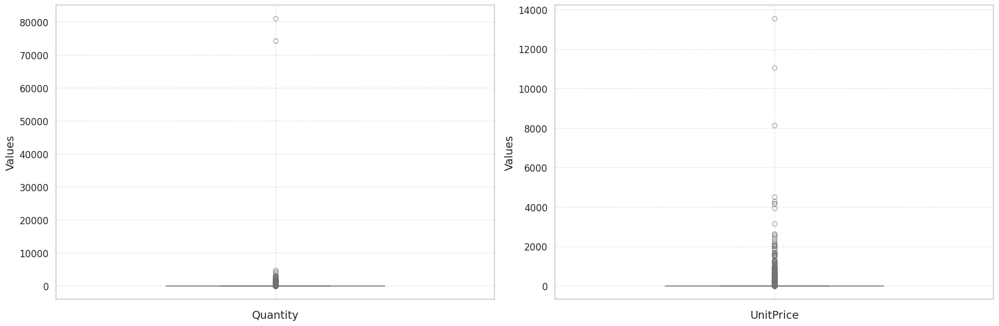

In [ ]:
# Make Box_Plot list to store both of the Boxplots before and after handling it
Box_Plot_list = []
# Set Seaborn style
sns.set(style="whitegrid")

# Create a figure with 1 row and 2 columns for subplots
fig, axes = plt.subplots(1, 2, figsize=(18, 6))

# Boxplot for Quantity
sns.boxplot(ax=axes[0], y='Quantity', data=E_Commerce_df,
            color='skyblue',
            width=0.5,
            flierprops=dict(marker='o', color='red', alpha=0.6)
)
axes[0].set_xlabel('Quantity', fontsize=14)
axes[0].set_ylabel('Values', fontsize=14)
axes[0].tick_params(axis='x', labelsize=12)
axes[0].tick_params(axis='y', labelsize=12)
axes[0].grid(True, linestyle='--', alpha=0.5)

# Boxplot for UnitPrice
sns.boxplot(ax=axes[1], y='UnitPrice', data=E_Commerce_df,
            color='lightgreen',
            width=0.5,
            flierprops=dict(marker='o', color='red', alpha=0.6)
)
axes[1].set_xlabel('UnitPrice', fontsize=14)
axes[1].set_ylabel('Values', fontsize=14)
axes[1].tick_params(axis='x', labelsize=12)
axes[1].tick_params(axis='y', labelsize=12)
axes[1].grid(True, linestyle='--', alpha=0.5)

# Adjust layout to prevent overlap
plt.tight_layout()

# Save as png
plt.savefig('01_0.1_boxplotsbeforeNewApproach.png')
# Add it to the list
Box_Plot_list.append(fig)
# Show the combined plot
plt.show()

As the describe and the boxplots shows, we have Outliers in Quantity, and UnitPrice columns.
Let us detect the Outliers by more statistical approach by using IQR.

In [ ]:
# Function to detect the outliers using IQR.
def detect_outliers_iqr(df: pd.DataFrame, column: str) -> pd.DataFrame:
    Q1 = df[column].quantile(0.25)
    Q3 = df[column].quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR

    outliers = df[(df[column] < lower_bound) | (df[column] > upper_bound)]
    return outliers

Let us take a closer look to the ouliers in Quantity column.

In [ ]:
quantity_outliers = detect_outliers_iqr(E_Commerce_df, 'Quantity')
print('Number of outliers in Quantity column:', quantity_outliers.shape[0])
print(f'Percenetage of outliers in Quantity column: {(quantity_outliers.shape[0]/E_Commerce_df.shape[0])*100:.2f}')

Number of outliers in Quantity column: 27111
Percenetage of outliers in Quantity column: 5.17


In [ ]:
quantity_outliers.head()

,InvoiceNo,StockCode,Description,Quantity,InvoiceDate,UnitPrice,CustomerID,Country
9,536367,84879,ASSORTED COLOUR BIRD ORNAMENT,32,2010-12-01 08:34:00,1.69,13047.0,United Kingdom
31,536370,10002,INFLATABLE POLITICAL GLOBE,48,2010-12-01 08:45:00,0.85,12583.0,France
44,536370,22492,MINI PAINT SET VINTAGE,36,2010-12-01 08:45:00,0.65,12583.0,France
46,536371,22086,PAPER CHAIN KIT 50'S CHRISTMAS,80,2010-12-01 09:00:00,2.55,13748.0,United Kingdom
65,536374,21258,VICTORIAN SEWING BOX LARGE,32,2010-12-01 09:09:00,10.95,15100.0,United Kingdom


In [ ]:
display(quantity_outliers.describe())
display(E_Commerce_df[E_Commerce_df['Quantity']<=np.quantile(E_Commerce_df['Quantity'], 0.75)*1.5].describe())

,Quantity,InvoiceDate,UnitPrice,CustomerID
count,27111.000000,27111,27111.000000,25663.000000
mean,97.525101,2011-07-06 08:27:29.932499712,1.586852,15073.924132
min,27.000000,2010-12-01 08:34:00,0.040000,12346.000000
25%,40.000000,2011-04-05 09:32:00,0.420000,13694.000000
50%,48.000000,2011-07-24 13:11:00,1.250000,14769.000000
75%,96.000000,2011-10-13 11:50:00,1.950000,16617.500000
max,80995.000000,2011-12-09 12:25:00,649.500000,18287.000000
std,681.302697,NaN,4.264075,1720.515240


,Quantity,InvoiceDate,UnitPrice,CustomerID
count,460924.000000,460924,460924.000000,331711.000000
mean,4.498436,2011-07-04 02:19:36.686872320,4.272243,15334.359084
min,1.000000,2010-12-01 08:26:00,0.001000,12347.000000
25%,1.000000,2011-03-25 12:00:00,1.250000,14031.000000
50%,3.000000,2011-07-18 15:56:00,2.460000,15251.000000
75%,6.000000,2011-10-19 15:29:00,4.210000,16839.000000
max,16.000000,2011-12-09 12:50:00,13541.330000,18287.000000
std,4.048544,NaN,38.486525,1706.351859


Let us take a look to the distrbution of the outliers:

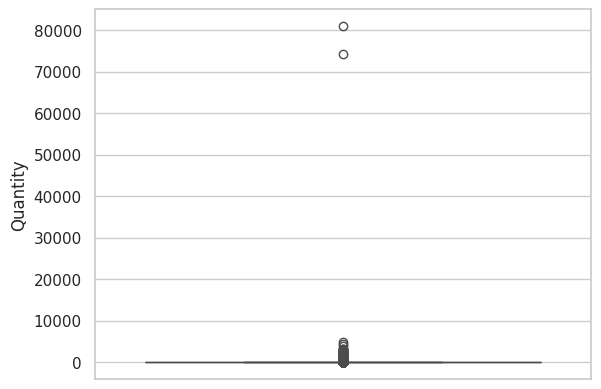

In [ ]:
sns.boxplot(y = quantity_outliers['Quantity'])
plt.show()

### **4.2.5 Deal with Outliers in UnitPrice**
**Our Approach**
1.  **Split the dataset:**

  * We will create two datasets: one with the outliers and one without them. This will help isolate the problem areas (outliers) and work on them separately.

2.  **Identify outliers:**

  * For detecting outliers, a common method could be using IQR (Interquartile Range) or Z-scores to filter out extreme values. In your case, you're likely focusing on the UnitPrice, and it would make sense to filter out values that are abnormally high compared to the rest of the data.

3.  **Guess the price of each outlier:**

  * We'll compute the average price for each `StockCode`. For `StockCode` values in the outlier dataset, We will replace the `UnitPrice` with the average price for that `StockCode` from the non-outlier dataset.
4.  **Update the original dataset:**

  * After updating the outlier dataset, we will combine it back with the dataset without outliers to get a clean dataset for further analysis.




Step 1: Identify outliers using IQR or Z-score (I'll use IQR for this example)

In [ ]:
# Step 1: Identify outliers using IQR or Z-score (I'll use IQR for this example)
Q1 = E_Commerce_df['UnitPrice'].quantile(0.25)
Q3 = E_Commerce_df['UnitPrice'].quantile(0.75)
IQR = Q3 - Q1
lower_bound = Q1 - 1.5 * IQR
upper_bound = Q3 + 1.5 * IQR

Step 2: Split the data into two datasets


In [ ]:
# Split the data into two datasets
dataset_outliers = E_Commerce_df[(E_Commerce_df['UnitPrice'] < lower_bound) | (E_Commerce_df['UnitPrice'] > upper_bound)]
dataset_without_outlier = E_Commerce_df[(E_Commerce_df['UnitPrice'] >= lower_bound) & (E_Commerce_df['UnitPrice'] <= upper_bound)]
# Display the head of the both datasets
print("Dataset with outliers:")
display(dataset_outliers.head())
print("Dataset without outliers:")
display(dataset_without_outlier.head())


Dataset with outliers:


,InvoiceNo,StockCode,Description,Quantity,InvoiceDate,UnitPrice,CustomerID,Country
16,536367,22622,BOX OF VINTAGE ALPHABET BLOCKS,2,2010-12-01 08:34:00,9.95,13047.0,United Kingdom
45,536370,POST,POSTAGE,3,2010-12-01 08:45:00,18.00,12583.0,France
65,536374,21258,VICTORIAN SEWING BOX LARGE,32,2010-12-01 09:09:00,10.95,15100.0,United Kingdom
151,536382,22839,3 TIER CAKE TIN GREEN AND CREAM,2,2010-12-01 09:45:00,14.95,16098.0,United Kingdom
152,536382,22838,3 TIER CAKE TIN RED AND CREAM,2,2010-12-01 09:45:00,14.95,16098.0,United Kingdom


Dataset without outliers:


,InvoiceNo,StockCode,Description,Quantity,InvoiceDate,UnitPrice,CustomerID,Country
0,536365,85123A,WHITE HANGING HEART T-LIGHT HOLDER,6,2010-12-01 08:26:00,2.55,17850.0,United Kingdom
1,536365,71053,WHITE METAL LANTERN,6,2010-12-01 08:26:00,3.39,17850.0,United Kingdom
2,536365,84406B,CREAM CUPID HEARTS COAT HANGER,8,2010-12-01 08:26:00,2.75,17850.0,United Kingdom
3,536365,84029G,KNITTED UNION FLAG HOT WATER BOTTLE,6,2010-12-01 08:26:00,3.39,17850.0,United Kingdom
4,536365,84029E,RED WOOLLY HOTTIE WHITE HEART.,6,2010-12-01 08:26:00,3.39,17850.0,United Kingdom


Step 3: Replace UnitPrice in outlier dataset with the average price for the same StockCode from dataset_without_outlier


In [ ]:
# Calculate the average UnitPrice per StockCode in the dataset_without_outlier
average_prices = dataset_without_outlier.groupby('StockCode')['UnitPrice'].mean()
# Display the head of the dataset
print("Average prices per StockCode:")
display(average_prices.head())

Average prices per StockCode:


,UnitPrice
StockCode,
10002,1.086620
10080,0.410909
10120,0.210000
10123C,0.650000
10124A,0.420000


In [ ]:
# Create a function to replace the outlier price with the average price
def replace_outlier_price(row):
  if row['UnitPrice'] < lower_bound or row['UnitPrice'] > upper_bound:
      # Use the average price or keep the original if StockCode is not found
      return average_prices.get(row['StockCode'], row['UnitPrice'])
  return row['UnitPrice']

In [ ]:
# Apply the function to replace prices in the outlier dataset
dataset_outliers['UnitPrice'] = dataset_outliers.apply(replace_outlier_price, axis=1)

In [ ]:
# Check for duplicates
print('Number of dublicated rows:\n', dataset_outliers.duplicated().sum(),
      '\nPercentage of of dublicated rows:\n',
      f"{(dataset_outliers.duplicated().sum()/dataset_outliers.shape[0])*100:.2f}%")
# This Approach Produced 13 Duplicate row after filling our UnitePrice with the same value which is the average

Number of dublicated rows:
 13 
Percentage of of dublicated rows:
 0.03%


Step 4: Combine the dataset back together (with updated prices)




In [ ]:
final_dataset = pd.concat([dataset_without_outlier, dataset_outliers])

Step 5: Save the dataset

In [ ]:
final_dataset.to_csv("cleaned_ecommerce_data_afterourapproach.csv", index=False)

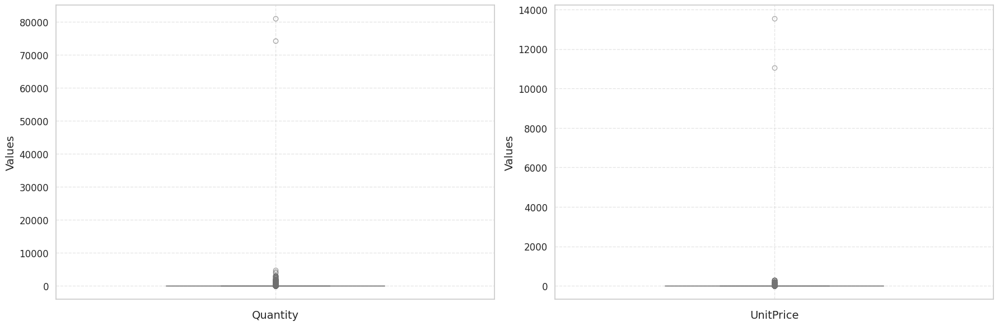

In [ ]:
# Check for outliers again
# Set Seaborn style
sns.set(style="whitegrid")

# Create a figure with 1 row and 2 columns for subplots
fig, axes = plt.subplots(1, 2, figsize=(18, 6))

# Boxplot for Quantity
sns.boxplot(ax=axes[0], y='Quantity', data=final_dataset,
            color='skyblue',
            width=0.5,
            flierprops=dict(marker='o', color='red', alpha=0.6)
)
axes[0].set_xlabel('Quantity', fontsize=14)
axes[0].set_ylabel('Values', fontsize=14)
axes[0].tick_params(axis='x', labelsize=12)
axes[0].tick_params(axis='y', labelsize=12)
axes[0].grid(True, linestyle='--', alpha=0.5)

# Boxplot for UnitPrice
sns.boxplot(ax=axes[1], y='UnitPrice', data=final_dataset,
            color='lightgreen',
            width=0.5,
            flierprops=dict(marker='o', color='red', alpha=0.6)
)
axes[1].set_xlabel('UnitPrice', fontsize=14)
axes[1].set_ylabel('Values', fontsize=14)
axes[1].tick_params(axis='x', labelsize=12)
axes[1].tick_params(axis='y', labelsize=12)
axes[1].grid(True, linestyle='--', alpha=0.5)

# Adjust layout to prevent overlap
plt.tight_layout()

# Save as png
plt.savefig('01_0.1_boxplotsafterNewApproach.png')
# Add it to the list
Box_Plot_list.append(fig)
# Show the combined plot
plt.show()

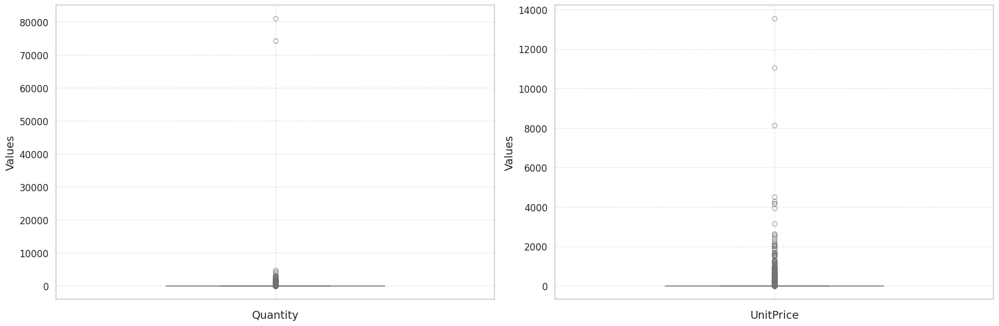

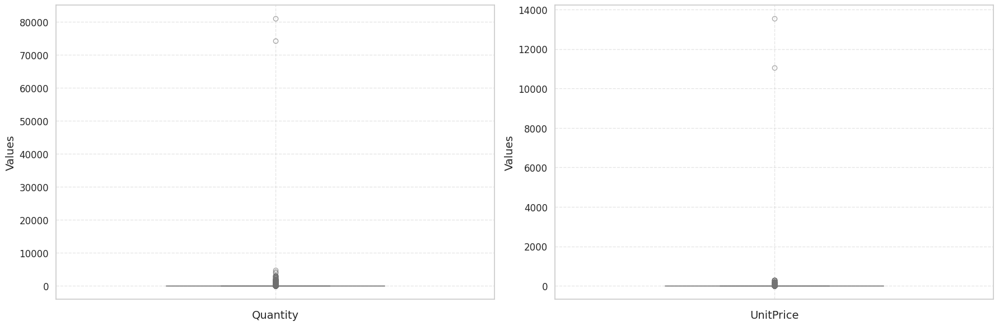

In [ ]:
# Print both of the figures
for fig in Box_Plot_list:
  display(fig)

From the boxplot of Unit price we can see that there is two record alone above 10,000 lets invistegate them to see if we can drop them

In [ ]:
final_dataset[final_dataset['UnitPrice']>2000]

,InvoiceNo,StockCode,Description,Quantity,InvoiceDate,UnitPrice,CustomerID,Country
15017,537632,AMAZONFEE,AMAZON FEE,1,2010-12-07 15:08:00,13541.33,NaN,United Kingdom
299982,A563185,B,Adjust bad debt,1,2011-08-12 14:50:00,11062.06,NaN,United Kingdom


We have two rows with prices over 10000, and They don't look like real products, So we can remove them safely.

In [ ]:
# Compare the number of outliers before and after our approach
No_of_outliers_before =len(E_Commerce_df[(E_Commerce_df['UnitPrice'] < lower_bound) | (E_Commerce_df['UnitPrice'] > upper_bound)])
No_of_outliers_after = len(final_dataset[(final_dataset['UnitPrice'] < lower_bound) | (final_dataset['UnitPrice'] > upper_bound)])
print(f"Number of outliers before our approach: {No_of_outliers_before}")
print(f"Number of outliers after our approach: {No_of_outliers_after}")

Number of outliers before our approach: 37827
Number of outliers after our approach: 10456


We decreased the number of outliers from 37,827 to 10,456
From the Box plot of UnitPrice, we can find that there is two categories only which have a very big value so we can drop them

In [ ]:
# Drop the records which have UnitPrice > 10000
final_dataset = final_dataset[final_dataset['UnitPrice'] < 10000]
No_of_outliers_after = len(final_dataset[(final_dataset['UnitPrice'] < lower_bound) | (final_dataset['UnitPrice'] > upper_bound)])
print(f"Number of outliers after our approach: {No_of_outliers_after}")
print(f"Percentage of outliers after our approach: {(No_of_outliers_after/final_dataset.shape[0])*100:.2f}%")

Number of outliers after our approach: 10454
Percentage of outliers after our approach: 1.99%


From the boxplot of Unit price we can see that there is two record alone above 70,000 lets invistegate them to see if we can drop them

In [ ]:
final_dataset[final_dataset['Quantity']>70000]

,InvoiceNo,StockCode,Description,Quantity,InvoiceDate,UnitPrice,CustomerID,Country
61619,541431,23166,MEDIUM CERAMIC TOP STORAGE JAR,74215,2011-01-18 10:01:00,1.04,12346.0,United Kingdom
540421,581483,23843,"PAPER CRAFT , LITTLE BIRDIE",80995,2011-12-09 09:15:00,2.08,16446.0,United Kingdom


The Records don't make sense, we think it is wronge data so we will drop them and make further investigation

In [ ]:
final_dataset = final_dataset[final_dataset['Quantity']<10000]
final_dataset.describe()

,Quantity,InvoiceDate,UnitPrice,CustomerID
count,524874.000000,524874,524874.000000,392690.000000
mean,10.320968,2011-07-04 15:30:45.870094592,3.016547,15287.848407
min,1.000000,2010-12-01 08:26:00,0.001000,12347.000000
25%,1.000000,2011-03-28 12:13:00,1.250000,13955.000000
50%,4.000000,2011-07-20 11:22:00,2.080000,15150.000000
75%,11.000000,2011-10-19 11:41:00,4.130000,16791.000000
max,4800.000000,2011-12-09 12:50:00,295.000000,18287.000000
std,37.914233,NaN,3.811855,1713.536485


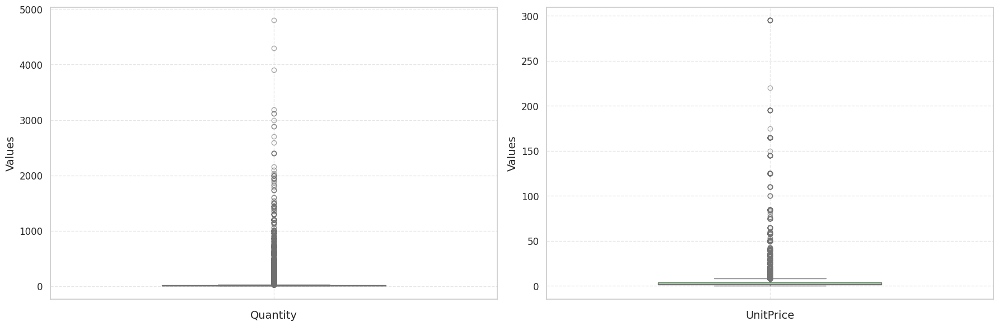

In [ ]:
# Check for outliers again
# Set Seaborn style
sns.set(style="whitegrid")

# Create a figure with 1 row and 2 columns for subplots
fig, axes = plt.subplots(1, 2, figsize=(18, 6))

# Boxplot for Quantity
sns.boxplot(ax=axes[0], y='Quantity', data=final_dataset,
            color='skyblue',
            width=0.5,
            flierprops=dict(marker='o', color='red', alpha=0.6)
)
axes[0].set_xlabel('Quantity', fontsize=14)
axes[0].set_ylabel('Values', fontsize=14)
axes[0].tick_params(axis='x', labelsize=12)
axes[0].tick_params(axis='y', labelsize=12)
axes[0].grid(True, linestyle='--', alpha=0.5)

# Boxplot for UnitPrice
sns.boxplot(ax=axes[1], y='UnitPrice', data=final_dataset,
            color='lightgreen',
            width=0.5,
            flierprops=dict(marker='o', color='red', alpha=0.6)
)
axes[1].set_xlabel('UnitPrice', fontsize=14)
axes[1].set_ylabel('Values', fontsize=14)
axes[1].tick_params(axis='x', labelsize=12)
axes[1].tick_params(axis='y', labelsize=12)
axes[1].grid(True, linestyle='--', alpha=0.5)

# Adjust layout to prevent overlap
plt.tight_layout()

# Save as png
plt.savefig('01_0.1_boxplotsafterNewApproach_2.png')
# Add it to the list
Box_Plot_list.append(fig)
# Show the combined plot
plt.show()

Let's investigate the quantities above 3500

In [ ]:
final_dataset[final_dataset['Quantity']>3500]

,InvoiceNo,StockCode,Description,Quantity,InvoiceDate,UnitPrice,CustomerID,Country
97432,544612,22053,EMPIRE DESIGN ROSETTE,3906,2011-02-22 10:43:00,0.82,18087.0,United Kingdom
206121,554868,22197,SMALL POPCORN HOLDER,4300,2011-05-27 10:52:00,0.72,13135.0,United Kingdom
421632,573008,84077,WORLD WAR 2 GLIDERS ASSTD DESIGNS,4800,2011-10-27 12:26:00,0.21,12901.0,United Kingdom


In [ ]:
# Investigate the records with CustomerID 18087 and 13135
final_dataset[final_dataset['CustomerID'].isin([18087, 13135])]

,InvoiceNo,StockCode,Description,Quantity,InvoiceDate,UnitPrice,CustomerID,Country
97432,544612,22053,EMPIRE DESIGN ROSETTE,3906,2011-02-22 10:43:00,0.820000,18087.0,United Kingdom
206121,554868,22197,SMALL POPCORN HOLDER,4300,2011-05-27 10:52:00,0.720000,13135.0,United Kingdom
323876,565377,M,Manual,1,2011-09-02 15:12:00,1.474417,18087.0,United Kingdom


Our observation is that those two customers don't buy alot so it is impossible to buy 3906 of Empire Design Rosette and 4300 From Small Popcore Holder so we think it is wrong data and we should drop them

Lets check the last customer 12901

In [ ]:
final_dataset[final_dataset['CustomerID']== 12901]

,InvoiceNo,StockCode,Description,Quantity,InvoiceDate,UnitPrice,CustomerID,Country
118627,546443,21791,VINTAGE HEADS AND TAILS CARD GAME,24,2011-03-14 10:41:00,1.25,12901.0,United Kingdom
118628,546443,21790,VINTAGE SNAP CARDS,24,2011-03-14 10:41:00,0.85,12901.0,United Kingdom
118629,546443,21915,RED HARMONICA IN BOX,60,2011-03-14 10:41:00,1.25,12901.0,United Kingdom
118630,546443,22561,WOODEN SCHOOL COLOURING SET,48,2011-03-14 10:41:00,1.65,12901.0,United Kingdom
118631,546443,84375,SET OF 20 KIDS COOKIE CUTTERS,24,2011-03-14 10:41:00,2.10,12901.0,United Kingdom
...,...,...,...,...,...,...,...,...
510389,579454,22651,GENTLEMAN SHIRT REPAIR KIT,1,2011-11-29 14:08:00,0.85,12901.0,United Kingdom
510390,579454,84077,WORLD WAR 2 GLIDERS ASSTD DESIGNS,48,2011-11-29 14:08:00,0.29,12901.0,United Kingdom
510391,579454,22440,BALLOON WATER BOMB PACK OF 35,90,2011-11-29 14:08:00,0.42,12901.0,United Kingdom
516562,579936,21787,RAIN PONCHO RETROSPOT,1200,2011-12-01 10:07:00,0.65,12901.0,United Kingdom


In [ ]:
display(final_dataset[final_dataset['CustomerID']== 12901].describe(), final_dataset.describe())

,Quantity,InvoiceDate,UnitPrice,CustomerID
count,116.000000,116,116.000000,116.0
mean,198.922414,2011-07-01 13:21:20.172413696,1.466379,12901.0
min,1.000000,2011-03-14 10:41:00,0.210000,12901.0
25%,12.000000,2011-04-26 15:45:00,0.420000,12901.0
50%,36.000000,2011-06-22 13:57:00,1.060000,12901.0
75%,111.000000,2011-08-23 10:56:00,1.950000,12901.0
max,4800.000000,2011-12-01 10:07:00,12.750000,12901.0
std,559.731102,NaN,1.619599,0.0


,Quantity,InvoiceDate,UnitPrice,CustomerID
count,524874.000000,524874,524874.000000,392690.000000
mean,10.320968,2011-07-04 15:30:45.870094592,3.016547,15287.848407
min,1.000000,2010-12-01 08:26:00,0.001000,12347.000000
25%,1.000000,2011-03-28 12:13:00,1.250000,13955.000000
50%,4.000000,2011-07-20 11:22:00,2.080000,15150.000000
75%,11.000000,2011-10-19 11:41:00,4.130000,16791.000000
max,4800.000000,2011-12-09 12:50:00,295.000000,18287.000000
std,37.914233,NaN,3.811855,1713.536485


In [ ]:
# Let's see how much
final_dataset[final_dataset['CustomerID']== 12901]['Quantity'].sort_values(ascending=False)[:10]

,Quantity
421632,4800
201149,2700
347563,1788
516562,1200
169123,1200
510373,774
473320,720
132895,600
270735,600
309597,600


It Seams that the third Customer with `CustomerID`:421632 is an important customer and he usually buys with high quantity so we think that is a real record not by mistake so we decided to keep this customer and drop the other customers

In [ ]:
final_dataset = final_dataset[~final_dataset['CustomerID'].isin([18087, 13135])]
final_dataset.describe()

,Quantity,InvoiceDate,UnitPrice,CustomerID
count,524871.000000,524871,524871.000000,392687.000000
mean,10.305391,2011-07-04 15:31:04.044307712,3.016558,15287.839633
min,1.000000,2010-12-01 08:26:00,0.001000,12347.000000
25%,1.000000,2011-03-28 12:13:00,1.250000,13955.000000
50%,4.000000,2011-07-20 11:22:00,2.080000,15150.000000
75%,11.000000,2011-10-19 11:41:00,4.130000,16791.000000
max,4800.000000,2011-12-09 12:50:00,295.000000,18287.000000
std,37.061079,NaN,3.811863,1713.527942


In [ ]:
# Get the number of outliers
Q1 = final_dataset['UnitPrice'].quantile(0.25)
Q3 = final_dataset['UnitPrice'].quantile(0.75)
IQR = Q3 - Q1
lower_bound = Q1 - 1.5 * IQR
upper_bound = Q3 + 1.5 * IQR
No_of_outliers_after = len(final_dataset[(final_dataset['UnitPrice'] < lower_bound) | (final_dataset['UnitPrice'] > upper_bound)])
print(f"Number of outliers after our approach: {No_of_outliers_after}")


Number of outliers after our approach: 10454


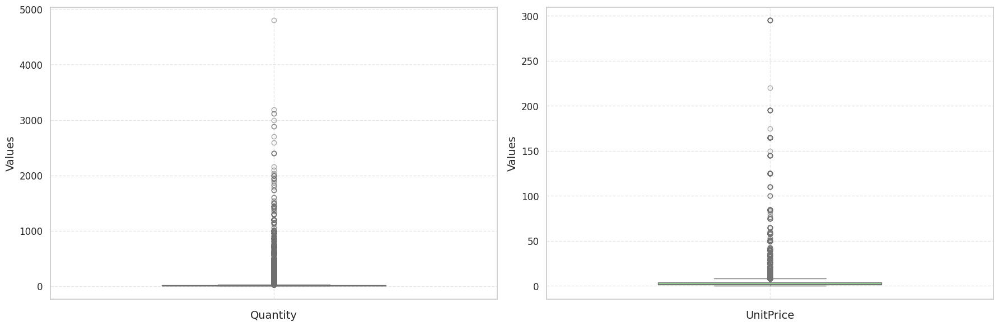

In [ ]:
# Plot box plot
# Check for outliers again
# Set Seaborn style
sns.set(style="whitegrid")

# Create a figure with 1 row and 2 columns for subplots
fig, axes = plt.subplots(1, 2, figsize=(18, 6))

# Boxplot for Quantity
sns.boxplot(ax=axes[0], y='Quantity', data=final_dataset,
            color='skyblue',
            width=0.5,
            flierprops=dict(marker='o', color='red', alpha=0.6)
)
axes[0].set_xlabel('Quantity', fontsize=14)
axes[0].set_ylabel('Values', fontsize=14)
axes[0].tick_params(axis='x', labelsize=12)
axes[0].tick_params(axis='y', labelsize=12)
axes[0].grid(True, linestyle='--', alpha=0.5)

# Boxplot for UnitPrice
sns.boxplot(ax=axes[1], y='UnitPrice', data=final_dataset,
            color='lightgreen',
            width=0.5,
            flierprops=dict(marker='o', color='red', alpha=0.6)
)
axes[1].set_xlabel('UnitPrice', fontsize=14)
axes[1].set_ylabel('Values', fontsize=14)
axes[1].tick_params(axis='x', labelsize=12)
axes[1].tick_params(axis='y', labelsize=12)
axes[1].grid(True, linestyle='--', alpha=0.5)

# Adjust layout to prevent overlap
plt.tight_layout()

# Save as png
plt.savefig('01_0.1_boxplotsafterNewApproach_2.png')
# Add it to the list
Box_Plot_list.append(fig)
# Show the combined plot
plt.show()

Boxplot 0


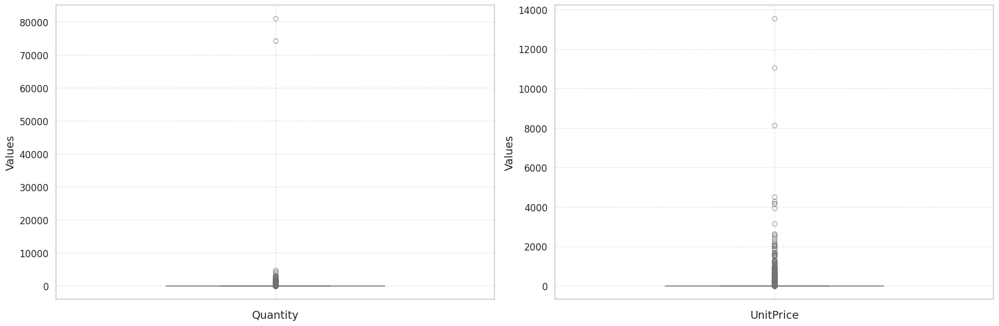

Boxplot 1


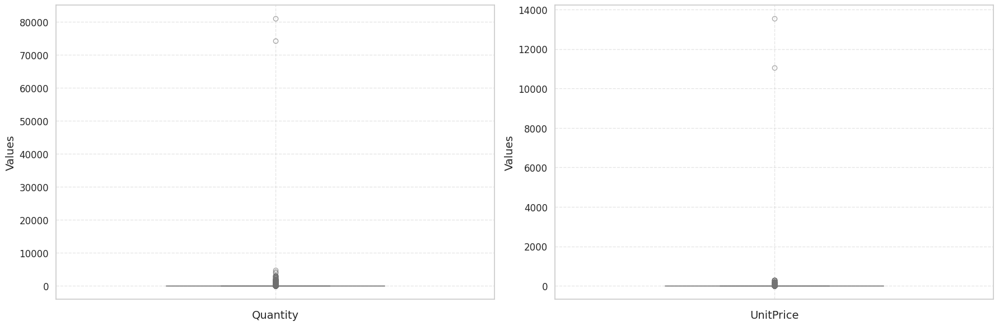

Boxplot 2


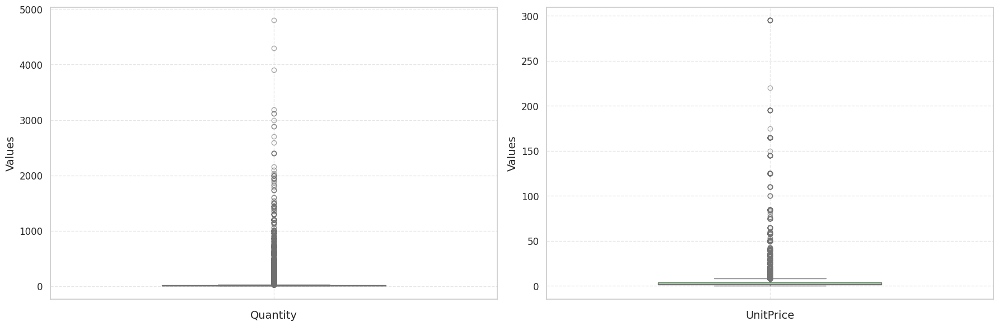

Boxplot 3


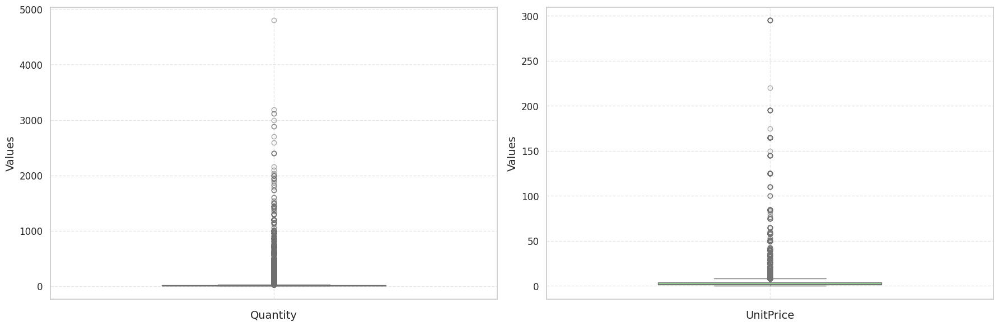

In [ ]:
# Print the plots with each other
i = 0
for fig in Box_Plot_list:
  print(f"Boxplot {i}")
  i+=1
  display(fig)

## **4.2.5 Observation**
  * We succedded to drop the number of outliers from 37827 to 10454
  * We should continue the investigation to see if the outliers has a meaning or it is just random numbers but we decided to stop due to time
  * We should use any other approach to deal with outliers such as capping or transformation but we decided that we keep the outliers even if we are sure it will affect out distribution

##**4.1 Hanle missing values with `CustomerID`**

📝 **Objective:**

To address missing `CustomerID` values in a logical methode while preserving data integrity and minimizing data loss.

🔍 **Problem Statement:**
  * The `CustomerID` column contains missing values.
  * However, `InvoiceNo` serves as a unique identifier for transactions.
  * Rows sharing the same `InvoiceNo` likely belong to the same `customerID`.

💡 **Approach Overview:**

  * **Step 1** : Filling missing `CustomerID` using **Existing Values**:
    * For rows with the same `InvoiceCode`, check if any row valid `CustomerID`
    * If a valid `CustomerID` exists, propagate this value to all other rows sharing the same `InvoiceNo`.

  * **Step 2** :  Handle Fully Missing `CustomerID` Groups
    * If all rows with the same `InvoiceNo` have missing CustomerID, assign -1 value, So we prevent losing 25% of our data, but we will execlude these rows before doing analysis based on the customerID like (Customer Behaviour Analysis, and Customer Segmentation).




In [ ]:
# first of all take a copy for the dataset so that we can return to the original dataset anytime we want
E_Commerce_df_copy = final_dataset.copy()

In [ ]:
E_Commerce_df_copy.head()

,InvoiceNo,StockCode,Description,Quantity,InvoiceDate,UnitPrice,CustomerID,Country
0,536365,85123A,WHITE HANGING HEART T-LIGHT HOLDER,6,2010-12-01 08:26:00,2.55,17850.0,United Kingdom
1,536365,71053,WHITE METAL LANTERN,6,2010-12-01 08:26:00,3.39,17850.0,United Kingdom
2,536365,84406B,CREAM CUPID HEARTS COAT HANGER,8,2010-12-01 08:26:00,2.75,17850.0,United Kingdom
3,536365,84029G,KNITTED UNION FLAG HOT WATER BOTTLE,6,2010-12-01 08:26:00,3.39,17850.0,United Kingdom
4,536365,84029E,RED WOOLLY HOTTIE WHITE HEART.,6,2010-12-01 08:26:00,3.39,17850.0,United Kingdom


In [ ]:
# Check Null values
E_Commerce_df_copy.isnull().sum()

,0
InvoiceNo,0
StockCode,0
Description,0
Quantity,0
InvoiceDate,0
UnitPrice,0
CustomerID,132184
Country,0


In [ ]:
# Print records missing customer id
Unique_Invoice_missing = E_Commerce_df_copy[E_Commerce_df_copy['CustomerID'].isnull()]['InvoiceNo'].unique()
Unique_Invoice_nonmissing = E_Commerce_df_copy[E_Commerce_df_copy['CustomerID'].isnull() == False]['InvoiceNo'].unique()
print(f"Number of records non missing CustomerID: {len(Unique_Invoice_nonmissing)}")
print(Unique_Invoice_nonmissing)
print(f"Number of records missing CustomerID: {len(Unique_Invoice_missing)}")
print(Unique_Invoice_missing)

# Get the intersect between the two sets to check if there is one missing customer have the same InvoiceNo of one who has CustomerID
Intersect_Union = set(Unique_Invoice_missing).intersection(set(Unique_Invoice_nonmissing))
print(f"Set of records missing CustomerID and non missing CustomerID: {len(Intersect_Union)}")
print("This means that our first approach will not work for this dataset")

# Step 1: Fill missing CustomerID from same InvoiceNo
E_Commerce_df_copy['CustomerID'] = E_Commerce_df_copy.groupby('InvoiceNo')['CustomerID'].transform(lambda x: x.fillna(method='ffill').fillna(method='bfill'))

# Step 2: Assign InvoiceNo as CustomerID if still missing
E_Commerce_df_copy['CustomerID'].fillna(-1, inplace=True)
print("✅ CustomerID column was filled successfully.")

Number of records non missing CustomerID: 18527
['536365' '536366' '536367' ... '580706' '581110' '581127']
Number of records missing CustomerID: 1426
['536544' '536555' '536565' ... '573307' '576234' '578823']
Set of records missing CustomerID and non missing CustomerID: 0
This means that our first approach will not work for this dataset
✅ CustomerID column was filled successfully.


In [ ]:
# prints columns with CustomerID = InvociceNo unique values
print("Values Count of")
display(E_Commerce_df_copy[E_Commerce_df_copy['CustomerID'] == E_Commerce_df_copy['InvoiceNo']]['CustomerID'].value_counts())
print("Total CustomerID that has been replaced by InvoiceNo")
display(E_Commerce_df_copy[E_Commerce_df_copy['CustomerID'] == E_Commerce_df_copy['InvoiceNo']]['CustomerID'].count())
print("if we compared the values.count() after replacing and before replacing we find that they are the same 3710")
print("if we copared the .count after replacing and before replacing we find that they are the same 135080")
print("✅ CustomerID column was replaced successfully.")

Values Count of


,count
CustomerID,


Total CustomerID that has been replaced by InvoiceNo


0

if we compared the values.count() after replacing and before replacing we find that they are the same 3710
if we copared the .count after replacing and before replacing we find that they are the same 135080
✅ CustomerID column was replaced successfully.


In [ ]:
# Check Null values
E_Commerce_df_copy.isnull().sum()

,0
InvoiceNo,0
StockCode,0
Description,0
Quantity,0
InvoiceDate,0
UnitPrice,0
CustomerID,0
Country,0


##**4.2 Convert `InvoiceDate` to DateTime type**
This step is already done during our analysis but we made it again for readability


In [ ]:
# Converting InvoiceDate to DateTime types for time series analysis
E_Commerce_df_copy['InvoiceDate'] = pd.to_datetime(E_Commerce_df_copy['InvoiceDate'])
print("✅ InvoiceDate column converted to datetime.")

✅ InvoiceDate column converted to datetime.


##**4.3 Remove rows with negative `Quantity` or UnitPrice**
This step is already done during our analysis but we made it again for readability

In [ ]:
# Removing rows with negative Qunatitiy or UnitPrice
E_Commerce_df_copy = E_Commerce_df_copy[E_Commerce_df_copy['Quantity'] > 0]
E_Commerce_df_copy = E_Commerce_df_copy[E_Commerce_df_copy['UnitPrice'] > 0]
print("✅ Rows with negative Quantity and UnitPrice were removed successfully.")
print(f"New size of the dataSet: {E_Commerce_df_copy.shape}")

✅ Rows with negative Quantity and UnitPrice were removed successfully.
New size of the dataSet: (524871, 8)



##**4.4 Create a `TotalPrice` column**

In [ ]:
# Creating a TotalPrice Column
E_Commerce_df_copy['TotalPrice'] = E_Commerce_df_copy['Quantity'] * E_Commerce_df_copy['UnitPrice']
print("✅ TotalPrice column was created successfully.")

✅ TotalPrice column was created successfully.


In [ ]:
# Printing the head of our data
E_Commerce_df_copy.head()

,InvoiceNo,StockCode,Description,Quantity,InvoiceDate,UnitPrice,CustomerID,Country,TotalPrice
0,536365,85123A,WHITE HANGING HEART T-LIGHT HOLDER,6,2010-12-01 08:26:00,2.55,17850.0,United Kingdom,15.30
1,536365,71053,WHITE METAL LANTERN,6,2010-12-01 08:26:00,3.39,17850.0,United Kingdom,20.34
2,536365,84406B,CREAM CUPID HEARTS COAT HANGER,8,2010-12-01 08:26:00,2.75,17850.0,United Kingdom,22.00
3,536365,84029G,KNITTED UNION FLAG HOT WATER BOTTLE,6,2010-12-01 08:26:00,3.39,17850.0,United Kingdom,20.34
4,536365,84029E,RED WOOLLY HOTTIE WHITE HEART.,6,2010-12-01 08:26:00,3.39,17850.0,United Kingdom,20.34


In [ ]:
# Printing the info of our data
E_Commerce_df_copy.info()

<class 'pandas.core.frame.DataFrame'>
Index: 524871 entries, 0 to 541892
Data columns (total 9 columns):
 #   Column       Non-Null Count   Dtype         
---  ------       --------------   -----         
 0   InvoiceNo    524871 non-null  object        
 1   StockCode    524871 non-null  object        
 2   Description  524871 non-null  object        
 3   Quantity     524871 non-null  int64         
 4   InvoiceDate  524871 non-null  datetime64[ns]
 5   UnitPrice    524871 non-null  float64       
 6   CustomerID   524871 non-null  float64       
 7   Country      524871 non-null  object        
 8   TotalPrice   524871 non-null  float64       
dtypes: datetime64[ns](1), float64(3), int64(1), object(4)
memory usage: 40.0+ MB


In [ ]:
# Printing the describe of our data
E_Commerce_df_copy.describe()

,Quantity,InvoiceDate,UnitPrice,CustomerID,TotalPrice
count,524871.000000,524871,524871.000000,524871.000000,524871.000000
mean,10.305391,2011-07-04 15:31:04.044307712,3.016558,11437.484064,18.316495
min,1.000000,2010-12-01 08:26:00,0.001000,-1.000000,0.001000
25%,1.000000,2011-03-28 12:13:00,1.250000,-1.000000,3.810000
50%,4.000000,2011-07-20 11:22:00,2.080000,14350.000000,8.700000
75%,11.000000,2011-10-19 11:41:00,4.130000,16245.000000,17.340000
max,4800.000000,2011-12-09 12:50:00,295.000000,18287.000000,7144.720000
std,37.061079,NaN,3.811863,6799.929524,63.034792


In [ ]:
# Printing the number of missing values of each column
E_Commerce_df_copy.isnull().sum()

,0
InvoiceNo,0
StockCode,0
Description,0
Quantity,0
InvoiceDate,0
UnitPrice,0
CustomerID,0
Country,0
TotalPrice,0


In [ ]:
# Saving the dataset to csv file
E_Commerce_df_copy.to_csv('E_Commerce_df_filterd.csv', index=False)
print("✅ E_Commerce_df_copy.csv was saved successfully.")

✅ E_Commerce_df_copy.csv was saved successfully.


In [ ]:
# Print the number of features and records in our dataset
print(f"Number of features: {E_Commerce_df_copy.shape[1]}")
print(f"Number of records: {E_Commerce_df_copy.shape[0]}")
# Print the percentage of the records that had been deleted
print(f"Percentage of the records that had been deleted: {100 - (E_Commerce_df_copy.shape[0] / E_Commerce_df.shape[0]) * 100:.3}%")

Number of features: 9
Number of records: 524871
Percentage of the records that had been deleted: 0.00133%


In [ ]:
# Keep only one records for the duplicates
E_Commerce_df_copy = E_Commerce_df_copy.drop_duplicates(keep='first')

In [ ]:
print('Number of dublicated rows:\n', E_Commerce_df_copy.duplicated().sum(), '\nPercentage of of dublicated rows:\n',
      f"{(E_Commerce_df_copy.duplicated().sum()/E_Commerce_df.shape[0])*100:.2f}%")

Number of dublicated rows:
 0 
Percentage of of dublicated rows:
 0.00%


In [ ]:
E_Commerce_df_copy[E_Commerce_df_copy.duplicated()]

,InvoiceNo,StockCode,Description,Quantity,InvoiceDate,UnitPrice,CustomerID,Country,TotalPrice


## **4.5 Validation Checklist:**

In [ ]:
# - CustomerID: No missing values remain.
assert E_Commerce_df_copy['CustomerID'].isnull().sum() == 0, "❌ There are still missing CustomerID values."
# - InvoiceDate: Proper datetime format.
assert pd.api.types.is_datetime64_any_dtype(E_Commerce_df_copy['InvoiceDate']), "❌ InvoiceDate is not in datetime format."
# - Quantity and UnitPrice: No invalid values.
assert (E_Commerce_df_copy['Quantity'] > 0).all(), "❌ Invalid Quantity values detected."
assert (E_Commerce_df_copy['UnitPrice'] > 0).all(), "❌ Invalid UnitPrice values detected."
# - TotalPrice: Correctly calculated.
assert (E_Commerce_df_copy['TotalPrice'] == E_Commerce_df_copy['Quantity'] * E_Commerce_df_copy['UnitPrice']).all(), "❌ TotalPrice calculation error."
# Check for duplicates
assert E_Commerce_df_copy.duplicated().sum() == 0, "❌ Duplicates found in the dataset."

print("✅ All data cleaning requirements successfully validated.")

✅ All data cleaning requirements successfully validated.


## **4.7 Observations**
- The Dataset is now free from missing `CustomorID` entries, we have replaced `NaN` values with the `InvoiceNo`
- `InvoiceDate` is converted to `DateTime type`
- Invalid values in `Qunatity` and `Unitprice` have been removed
- `TotalPrice` column is successfully created for further analysis
- We have deleted `2.18%` of the dataset (which is the same percentage of the Negative values which was found in our ProfileReport)
- There was a duplicated records in our dataset (it has 849 (0.8%) of records that has been repeated and we managed to drop them)

# 📌 **5. Task 2 : Exploratory Data Analysis (EDA)**
**Description**: Perform basic descriptive statistics and identify insights from the dataset. Analyze top-selling products and calculate total revenue and transactions.values. You will also check the data types of each column to understand how the data is structured.

**Requirments**:
-  Use `.describe()` for statistical summary.
- Identify top 10 selling products by `Quantity`.
- Calculate `total revenue` and number of `transactions`.

**Responsible:** All Team Members


## 5.1 **`.describe()` for statistical summary.**

In [ ]:
# Printing describe() for statistical summary
E_Commerce_df_copy.describe()

,Quantity,InvoiceDate,UnitPrice,CustomerID,TotalPrice
count,524856.000000,524856,524856.000000,524856.000000,524856.000000
mean,10.305657,2011-07-04 15:30:29.316727296,3.016574,11437.534613,18.316948
min,1.000000,2010-12-01 08:26:00,0.001000,-1.000000,0.001000
25%,1.000000,2011-03-28 12:13:00,1.250000,-1.000000,3.810000
50%,4.000000,2011-07-20 11:22:00,2.080000,14352.000000,8.700000
75%,11.000000,2011-10-19 11:41:00,4.130000,16245.000000,17.340000
max,4800.000000,2011-12-09 12:50:00,295.000000,18287.000000,7144.720000
std,37.061575,NaN,3.811895,6799.946710,63.035634


##5.2 **Identify top 10 selling products by `Quantity`.**


In [ ]:
# Identifying top 10 selling produccts by Quantity (Q Description or Stokcode?)
top_10_selling_products = E_Commerce_df_copy.groupby('Description')['Quantity'].sum().sort_values(ascending=False).head(10)
print("Top 10 selling products by Quantity:")
print(top_10_selling_products)

Top 10 selling products by Quantity:
Description
WORLD WAR 2 GLIDERS ASSTD DESIGNS     54951
JUMBO BAG RED RETROSPOT               48371
WHITE HANGING HEART T-LIGHT HOLDER    37872
POPCORN HOLDER                        36749
PACK OF 72 RETROSPOT CAKE CASES       36396
ASSORTED COLOUR BIRD ORNAMENT         36362
RABBIT NIGHT LIGHT                    30739
MINI PAINT SET VINTAGE                26633
PACK OF 12 LONDON TISSUES             26119
PACK OF 60 PINK PAISLEY CAKE CASES    24820
Name: Quantity, dtype: int64



##**5.3 Calculate `total revenue` and number of `transactions`.**

In [ ]:
# Calculating total revenue and number of transactions
total_revenue = E_Commerce_df_copy['TotalPrice'].sum()
total_transactions = E_Commerce_df_copy['InvoiceNo'].nunique()
print(f"Total Revenue: ${total_revenue:.2f}")
print(f"Total Transactions: {total_transactions}")

Total Revenue: $9613760.14
Total Transactions: 19953


## **5.4 Observations**
- Significant revenue is generated from top-selling products.
- A large portion of transactions comes from high-demand products

# 📌 **6. Task 3 : Time Series Analysis**
**Description**: Analyze sales trends over time and visualize monthly sales. Identify months with highest and lowest sales.

**Requirments**:
-  Resample the data to obtain monthly sales
-  Plot monthly sales trends using a line plot.
-  Identify the month with the highest and lowest sales.

**Responsible:** Ahmed Hesham


## **6.1 Resample the data to obtain monthly sales**

In [ ]:
# Resampling the data to obtain monthly sales
monthly_sales = E_Commerce_df_copy.resample('M', on='InvoiceDate')['TotalPrice'].sum()
print("Monthly Sales:")
print(monthly_sales)

Monthly Sales:
InvoiceDate
2010-12-31    7.188996e+05
2011-01-31    5.728095e+05
2011-02-28    4.869295e+05
2011-03-31    6.618640e+05
2011-04-30    4.957723e+05
2011-05-31    7.113569e+05
2011-06-30    6.777346e+05
2011-07-31    6.650856e+05
2011-08-31    7.037135e+05
2011-09-30    1.008360e+06
2011-10-31    1.077179e+06
2011-11-30    1.405803e+06
2011-12-31    4.282523e+05
Freq: ME, Name: TotalPrice, dtype: float64


## **6.2 Plot monthly sales trends using a line plot.**

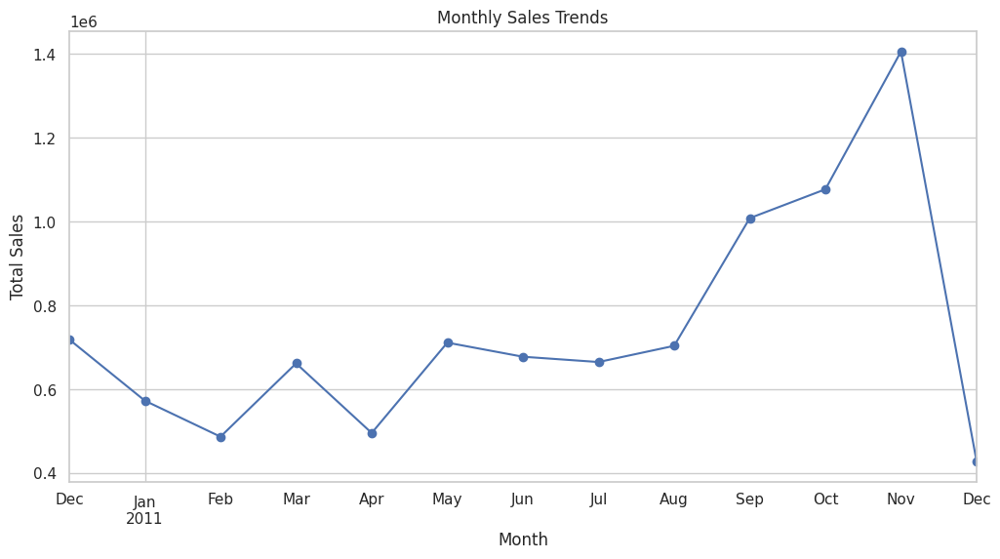

✅ Monthly sales trends plotted successfully.


In [ ]:
# Plot monthly sales trends using a line plot
plt.figure(figsize=(12, 6))
monthly_sales.plot(kind='line', marker='o')
plt.title('Monthly Sales Trends')
plt.xlabel('Month')
plt.ylabel('Total Sales')
plt.grid(True)
# save it as png
plt.savefig('0.3_0.1_monthly_sales_trends.png')
plt.show()
print("✅ Monthly sales trends plotted successfully.")

In [ ]:
# Use PX to plot the Monthly Sales Trends with slide bar
fig  = px.line(monthly_sales, x=monthly_sales.index, y=monthly_sales.values, title='Monthly Sales Trends',markers=True)
fig.update_xaxes(title_text='Month')
fig.update_yaxes(title_text='Total Sales')

# Add slider for monthly_sales.index
fig.update_layout(
    xaxis=dict(
        rangeselector=dict(
            buttons=list([
                dict(count=1, label="1m", step="month", stepmode="backward"),
                dict(count=6, label="6m", step="month", stepmode="backward"),
                dict(count=1, label="YTD", step="year", stepmode="todate"),
                dict(count=1, label="1y", step="year", stepmode="backward"),
                dict(step="all")
            ])
        ),
        rangeslider=dict(visible=True),
        type="date"
    )
)
# Save it as html file
fig.write_html('0.3_0.1_monthly_sales_trends.html')
fig.show()

## **6.3 Identify the month with the highest and lowest sales.**

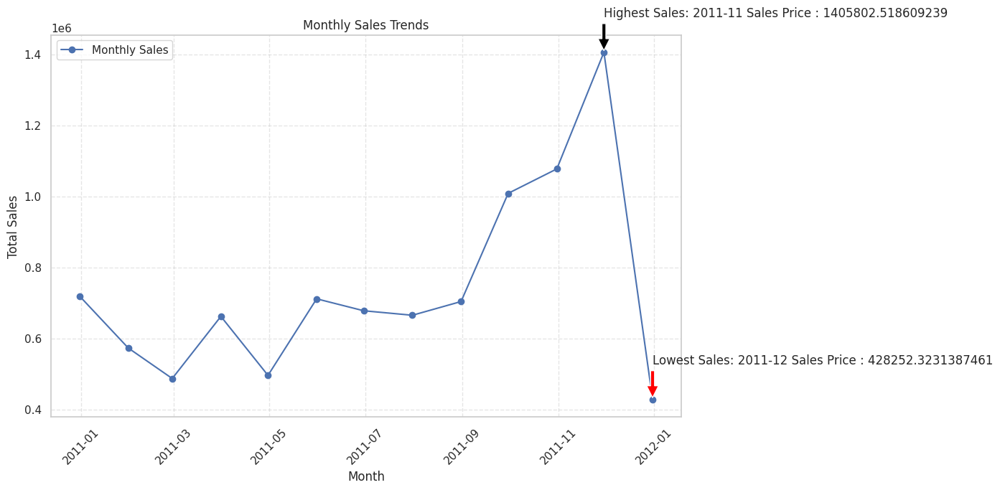

Highest Sales Month: 2011-11 : with value 1405802.518609239
Lowest Sales Month: 2011-12 : with value 428252.3231387461
✅ Identifing the month with the highest and lowest sales plotted successfully.


In [ ]:
# Identifing the month with the highest and lowest sales
highest_sales_month = monthly_sales.idxmax()
highest_sales_value = monthly_sales.max()
lowest_sales_month = monthly_sales.idxmin()
lowest_sales_value = monthly_sales.min()
# Make the plot with annotation on it max haighest sales and lowest sales
plt.figure(figsize=(14, 7))
# plot a lineplot
plt.plot(monthly_sales.index, monthly_sales.values, marker='o', linestyle='-', color='b')
# putting a title
plt.title('Monthly Sales Trends')
# putting a x-label
plt.xlabel('Month', fontsize=12)
# puttin a y-label
plt.ylabel('Total Sales', fontsize=12)
# rotating x-axis
plt.xticks(rotation=45)
# putting a legend
plt.legend(['Monthly Sales'])
plt.grid(True, linestyle='--', alpha=0.5)
# Making annotation for the higest and lowest value on the plot
plt.annotate(f'Highest Sales: {highest_sales_month.strftime("%Y-%m")} Sales Price : {highest_sales_value}',
              xy=(highest_sales_month, monthly_sales.max()),
              xytext=(highest_sales_month, monthly_sales.max()+ 100000),
              arrowprops=dict(facecolor='black', shrink=0.05))
plt.annotate(f'Lowest Sales: {lowest_sales_month.strftime("%Y-%m")} Sales Price : {lowest_sales_value}',
             xy=(lowest_sales_month, monthly_sales.min()),
             xytext=(lowest_sales_month, monthly_sales.min()+ 100000),
             arrowprops=dict(facecolor='red', shrink=0.05))
# Save it as a png
plt.savefig('0.3_0.2_monthly_sales_trends_with_annotation.png')
plt.tight_layout()
plt.show()

print(f"Highest Sales Month: {highest_sales_month.strftime('%Y-%m')} : with value {highest_sales_value}")
print(f"Lowest Sales Month: {lowest_sales_month.strftime('%Y-%m')} : with value {lowest_sales_value}")
print("✅ Identifing the month with the highest and lowest sales plotted successfully.")

In [ ]:
# Identifing the month with the highest and lowest sales using px with slider bar
fig = px.line(monthly_sales, x=monthly_sales.index, y=monthly_sales.values, title='Monthly Sales Trends',markers=True)
fig.update_xaxes(title_text='Month')
fig.update_yaxes(title_text='Total Sales')
# Making annotation for the higest and lowest value on the plot
# Highest Sales
fig.add_annotation(
    x=highest_sales_month,
    y=monthly_sales.max(),
    text=f'Highest Sales: {highest_sales_month.strftime("%Y-%m")}',
    showarrow=True,
    arrowhead=1,
    arrowsize=1,
    arrowwidth=1,
    arrowcolor='black',
    font=dict(size=12, color='black'),
    bgcolor='white',
    bordercolor='black',
    borderwidth=2,
    borderpad=4,
    xanchor='left',
    yanchor='bottom',
    xshift=10,
    yshift=10
)
# Lowest Sales
fig.add_annotation(
    x=lowest_sales_month,
    y=monthly_sales.min(),
    text=f'Lowest Sales: {lowest_sales_month.strftime("%Y-%m")}',
    showarrow=True,
    arrowhead=1,
    arrowsize=1,
    arrowwidth=1,
    arrowcolor='red',
    font=dict(size=12, color='red'),
    bgcolor='white',
    bordercolor='red',
    borderwidth=2,
    borderpad=4,
    xanchor='left',
    yanchor='bottom',
    xshift=10,
    yshift=10
)
# Add slider for monthly_sales.index
fig.update_layout(
    xaxis=dict(
        rangeselector=dict(
            buttons=list([
                dict(count=1, label="1m", step="month", stepmode="backward"),
                dict(count=6, label="6m", step="month", stepmode="backward"),
                dict(count=1, label="YTD", step="year", stepmode="todate"),
                dict(count=1, label="1y", step="year", stepmode="backward"),
                dict(step="all")
            ])
        ),
        rangeslider=dict(visible=True),
        type="date"
    )
)
# Save as html file
fig.write_html('0.3_0.2_monthly_sales_trends_with_annotation.html')
# Show the figure
fig.show()

## **6.4 Observations**


**📊 Monthly Sales Trend Analysis: Observations and Insights**

1.  **Overall Trend**:
  * Sales fluctuated throughout the year, with distinct peaks and troughs.
2.  **Lowest Sales Point**:
  * The lowest sales were recorded at `2011-12-31` with Sales `$428,252`
3.  **Highest Sales Point**
  * The highest sales were recorded at `2011-11-30` with Sales `$1.4M`
  * This could be attributed to seasonal factors such as holiday sales,   promotional campaigns, or other market-driven influences.
4.  **Stable Period**:
  * From `June 2011` to `Augest 2011`, sales remained relatively stable, hovering around the 700K to 800K range, without significant upward or downward spikes

5.  **Significant Decline Post-Peak**:
  * Following the peak in `November 2011`, sales dropped significantly in `January 2012`, signaling a sharp post-seasonal decline

# 📌 **7. Task 4 : RFM Analysis (Customer Segmentation)**
**Description**: Segment customers based on recency, frequency, and monetary value. Visualize customer distribution in segments.

**Requirments**:
-  Calculate recency (days since last purchase).
-  Calculate frequency (number of purchases).
-  Calculate monetary value (total spend).
-  Segment customers into High, Medium, Low-value groups.

**Responsible:** Abanoub Younan


In [ ]:
customer_analysis_df = E_Commerce_df_copy[E_Commerce_df_copy['CustomerID'] != -1].copy()
customer_analysis_df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 392676 entries, 0 to 541892
Data columns (total 9 columns):
 #   Column       Non-Null Count   Dtype         
---  ------       --------------   -----         
 0   InvoiceNo    392676 non-null  object        
 1   StockCode    392676 non-null  object        
 2   Description  392676 non-null  object        
 3   Quantity     392676 non-null  int64         
 4   InvoiceDate  392676 non-null  datetime64[ns]
 5   UnitPrice    392676 non-null  float64       
 6   CustomerID   392676 non-null  float64       
 7   Country      392676 non-null  object        
 8   TotalPrice   392676 non-null  float64       
dtypes: datetime64[ns](1), float64(3), int64(1), object(4)
memory usage: 30.0+ MB


##**7.1 Calculate recency (days since last purchase), number of purchases and total spend**

In [ ]:
customer_analysis_df = customer_analysis_df.groupby('CustomerID').agg({
    'InvoiceDate': 'max',
    'InvoiceNo': 'nunique',
    'TotalPrice': 'sum',
}).reset_index().rename(columns = {
    'InvoiceDate': 'RecentPurchase',
    'InvoiceNo': 'NumberOfPurchases',
    'TotalPrice': 'TotalSpend'
})
customer_analysis_df.head()

,CustomerID,RecentPurchase,NumberOfPurchases,TotalSpend
0,12347.0,2011-12-07 15:52:00,7,4176.540000
1,12348.0,2011-09-25 13:13:00,4,1464.988286
2,12349.0,2011-11-21 09:51:00,1,1447.996476
3,12350.0,2011-02-02 16:01:00,1,297.483143
4,12352.0,2011-11-03 14:37:00,8,1356.736751


In [ ]:
customer_analysis_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4335 entries, 0 to 4334
Data columns (total 4 columns):
 #   Column             Non-Null Count  Dtype         
---  ------             --------------  -----         
 0   CustomerID         4335 non-null   float64       
 1   RecentPurchase     4335 non-null   datetime64[ns]
 2   NumberOfPurchases  4335 non-null   int64         
 3   TotalSpend         4335 non-null   float64       
dtypes: datetime64[ns](1), float64(2), int64(1)
memory usage: 135.6 KB


In [ ]:
now = datetime.now()

customer_analysis_df['DaysFromLastPurchase'] = (now - customer_analysis_df['RecentPurchase']).dt.days
customer_analysis_df.head()

,CustomerID,RecentPurchase,NumberOfPurchases,TotalSpend,DaysFromLastPurchase
0,12347.0,2011-12-07 15:52:00,7,4176.540000,4772
1,12348.0,2011-09-25 13:13:00,4,1464.988286,4845
2,12349.0,2011-11-21 09:51:00,1,1447.996476,4788
3,12350.0,2011-02-02 16:01:00,1,297.483143,5080
4,12352.0,2011-11-03 14:37:00,8,1356.736751,4806


In [ ]:
customer_analysis_df.describe()

,CustomerID,RecentPurchase,NumberOfPurchases,TotalSpend,DaysFromLastPurchase
count,4335.000000,4335,4335.000000,4335.000000,4335.000000
mean,15300.946251,2011-09-08 12:24:49.065743872,4.273818,1913.970006,4862.026759
min,12347.000000,2010-12-01 09:53:00,1.000000,0.001000,4770.000000
25%,13814.500000,2011-07-21 00:20:00,1.000000,296.850000,4787.000000
50%,15300.000000,2011-10-20 10:47:00,2.000000,646.300000,4820.000000
75%,16778.500000,2011-11-22 11:03:30,5.000000,1591.095000,4911.500000
max,18287.000000,2011-12-09 12:50:00,209.000000,276496.094467,5143.000000
std,1720.984824,NaN,7.700346,8327.728903,99.976602


##**7.2 Segment customers into Low, Medium and High**

In [ ]:
# Determine the range of values and create three equal-width bins
bins = [customer_analysis_df['DaysFromLastPurchase'].min(),
        customer_analysis_df['DaysFromLastPurchase'].quantile(1/3),
        customer_analysis_df['DaysFromLastPurchase'].quantile(2/3),
        customer_analysis_df['DaysFromLastPurchase'].max()]

# Categorize into bins
customer_analysis_df['R_Score'] = pd.cut(
    customer_analysis_df['DaysFromLastPurchase'],
    bins=bins,
    labels=[3, 2, 1],
    include_lowest=True
).astype(int)

customer_analysis_df.head()

,CustomerID,RecentPurchase,NumberOfPurchases,TotalSpend,DaysFromLastPurchase,R_Score
0,12347.0,2011-12-07 15:52:00,7,4176.540000,4772,3
1,12348.0,2011-09-25 13:13:00,4,1464.988286,4845,2
2,12349.0,2011-11-21 09:51:00,1,1447.996476,4788,3
3,12350.0,2011-02-02 16:01:00,1,297.483143,5080,1
4,12352.0,2011-11-03 14:37:00,8,1356.736751,4806,2


In [ ]:
# Determine the range of values and create three equal-width bins
bins = [0,
        customer_analysis_df['NumberOfPurchases'].quantile(1/3),
        customer_analysis_df['NumberOfPurchases'].quantile(2/3),
        customer_analysis_df['NumberOfPurchases'].max()]

# Categorize into bins
customer_analysis_df['F_Score'] = pd.cut(
    customer_analysis_df['NumberOfPurchases'],
    bins=bins,
    labels=[1, 2, 3],
    include_lowest=True
).astype(int)

customer_analysis_df.head()

,CustomerID,RecentPurchase,NumberOfPurchases,TotalSpend,DaysFromLastPurchase,R_Score,F_Score
0,12347.0,2011-12-07 15:52:00,7,4176.540000,4772,3,3
1,12348.0,2011-09-25 13:13:00,4,1464.988286,4845,2,2
2,12349.0,2011-11-21 09:51:00,1,1447.996476,4788,3,1
3,12350.0,2011-02-02 16:01:00,1,297.483143,5080,1,1
4,12352.0,2011-11-03 14:37:00,8,1356.736751,4806,2,3


In [ ]:
# Determine the range of values and create three equal-width bins
bins = [customer_analysis_df['TotalSpend'].min(),
        customer_analysis_df['TotalSpend'].quantile(1/3),
        customer_analysis_df['TotalSpend'].quantile(2/3),
        customer_analysis_df['TotalSpend'].max()]

# Categorize into bins
customer_analysis_df['M_Score'] = pd.cut(
    customer_analysis_df['TotalSpend'],
    bins=bins,
    labels=[1, 2, 3],
    include_lowest=True
).astype(int)

customer_analysis_df.head()

,CustomerID,RecentPurchase,NumberOfPurchases,TotalSpend,DaysFromLastPurchase,R_Score,F_Score,M_Score
0,12347.0,2011-12-07 15:52:00,7,4176.540000,4772,3,3,3
1,12348.0,2011-09-25 13:13:00,4,1464.988286,4845,2,2,3
2,12349.0,2011-11-21 09:51:00,1,1447.996476,4788,3,1,3
3,12350.0,2011-02-02 16:01:00,1,297.483143,5080,1,1,1
4,12352.0,2011-11-03 14:37:00,8,1356.736751,4806,2,3,3


In [ ]:
customer_analysis_df['RFM_Score'] = customer_analysis_df['R_Score'] + customer_analysis_df['F_Score'] + customer_analysis_df['M_Score']
customer_analysis_df.head()

,CustomerID,RecentPurchase,NumberOfPurchases,TotalSpend,DaysFromLastPurchase,R_Score,F_Score,M_Score,RFM_Score
0,12347.0,2011-12-07 15:52:00,7,4176.540000,4772,3,3,3,9
1,12348.0,2011-09-25 13:13:00,4,1464.988286,4845,2,2,3,7
2,12349.0,2011-11-21 09:51:00,1,1447.996476,4788,3,1,3,7
3,12350.0,2011-02-02 16:01:00,1,297.483143,5080,1,1,1,3
4,12352.0,2011-11-03 14:37:00,8,1356.736751,4806,2,3,3,8


In [ ]:
customer_analysis_df['Customer_Value'] = pd.qcut(customer_analysis_df['RFM_Score'], q=3, labels=['Low', 'Medium', 'High'])  # Higher RFM Higher value
customer_analysis_df.head()

,CustomerID,RecentPurchase,NumberOfPurchases,TotalSpend,DaysFromLastPurchase,R_Score,F_Score,M_Score,RFM_Score,Customer_Value
0,12347.0,2011-12-07 15:52:00,7,4176.540000,4772,3,3,3,9,High
1,12348.0,2011-09-25 13:13:00,4,1464.988286,4845,2,2,3,7,Medium
2,12349.0,2011-11-21 09:51:00,1,1447.996476,4788,3,1,3,7,Medium
3,12350.0,2011-02-02 16:01:00,1,297.483143,5080,1,1,1,3,Low
4,12352.0,2011-11-03 14:37:00,8,1356.736751,4806,2,3,3,8,High


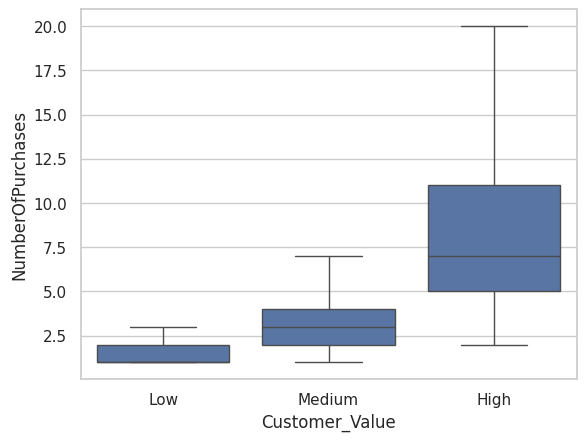

In [ ]:
sns.boxplot(y=customer_analysis_df['NumberOfPurchases'], x=customer_analysis_df['Customer_Value'], showfliers=False)
plt.show()

## **7.3 Plotting Segments**

In [ ]:
# Count the occurrences of each segment
segment_counts = customer_analysis_df['Customer_Value'].value_counts().reset_index()
segment_counts.columns = ['Segment', 'Count']
# Display segmend_count
segment_counts.head()

,Segment,Count
0,Low,1967
1,Medium,1215
2,High,1153


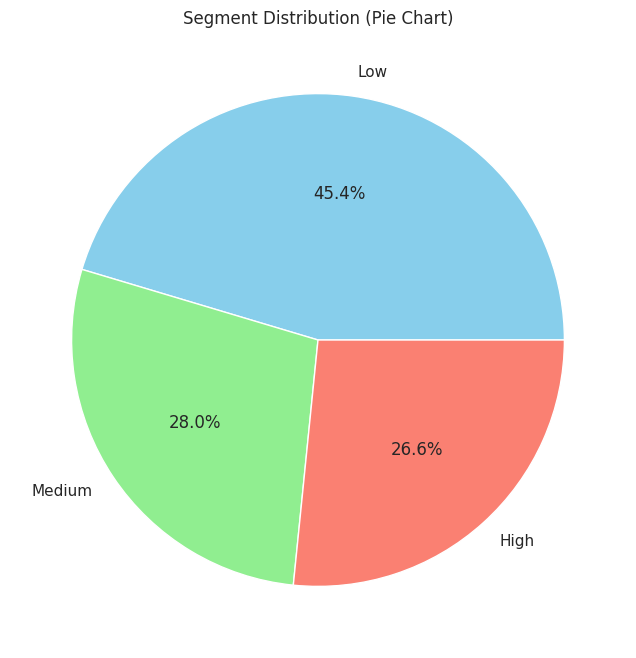

In [ ]:
plt.figure(figsize=(8, 8))
plt.pie(segment_counts['Count'], labels=segment_counts['Segment'], autopct='%1.1f%%', colors=['skyblue', 'lightgreen', 'salmon'])
plt.title('Segment Distribution (Pie Chart)')
# Save it to png
plt.savefig('0.4_segment_distribution_pie_chart.png')
plt.show()

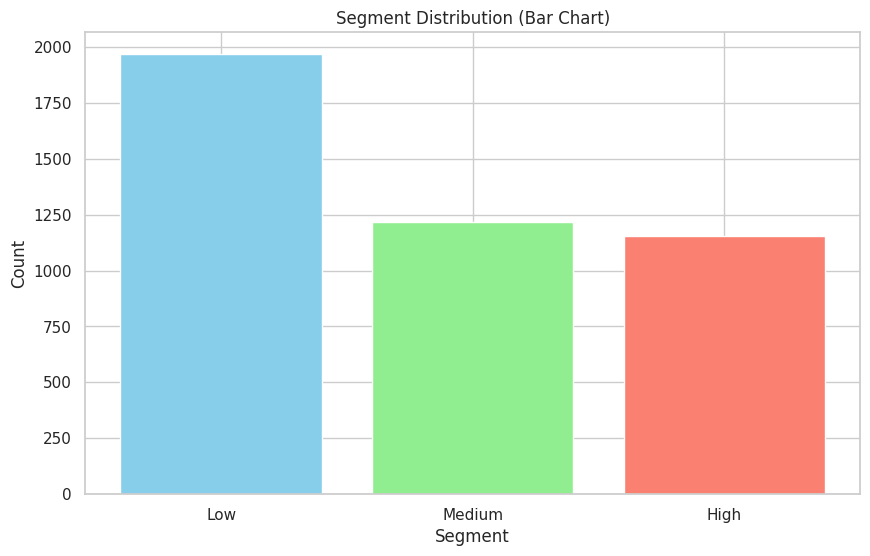

In [ ]:
plt.figure(figsize=(10, 6))
plt.bar(segment_counts['Segment'], segment_counts['Count'], color=['skyblue', 'lightgreen', 'salmon'])
plt.title('Segment Distribution (Bar Chart)')
plt.xlabel('Segment')
plt.ylabel('Count')
# Save it to png
plt.savefig('0.4_segment_distribution_bar_chart.png')
plt.show()

In [ ]:
fig = px.pie(segment_counts, names='Segment', values='Count', title='Segment Distribution (Pie Chart - Plotly)')
fig.show()
# Save it to html
fig.write_html('0.4_segment_distribution_pie_chart.html')
fig = px.bar(segment_counts, x='Segment', y='Count', title='Segment Distribution (Bar Chart - Plotly)', color='Segment')
fig.show()
# Save it to html
fig.write_html('0.4_segment_distribution_bar_chart.html')

In [ ]:
# See the disribution between number of purches and Customer value
fig = px.scatter(customer_analysis_df, x='NumberOfPurchases', y='Customer_Value', title='Number of Purchases vs. Customer Value')
fig.show()

CustomerID	RecentPurchase	NumberOfPurchases	TotalSpend	DaysFromLastPurchase		Customer_Value

In [ ]:
# See the relation between Customer_value and the rest of columns
# Customer_value vs NumberOfPurchases as boxplot using px each customer level with color

fig = px.box(customer_analysis_df, x='Customer_Value', y='NumberOfPurchases',
             color='Customer_Value',title='Customer_Value vs. NumberOfPurchases',points=False)
# Save the figure
fig.write_html('0.4_Customer_Value_vs_NumberOfPurchases.html')
fig.show()

# Customer_value vs DaysFromLastPurchaese
fig = px.box(customer_analysis_df, x='Customer_Value', y='DaysFromLastPurchase',color='Customer_Value' ,
             title='Customer_Value vs. Days_From_Last_Purchase',points=False)
# Save the figure
fig.write_html('0.4_Customer_Value_vs_Days_From_Last_Purchase.html')
fig.show()

# Custumer_Value vs TotalSpend
fig = px.box(customer_analysis_df, x='Customer_Value', y='TotalSpend',color='Customer_Value' ,
             title='Customer_Value vs. Total_Spend',points=False)
# Save the figure
fig.write_html('0.4_Customer_Value_vs_Total_Spend.html')
fig.show()

In [ ]:
# Plot 3D to easly visualize distribution
fig = px.scatter_3d(customer_analysis_df, x='NumberOfPurchases', y='DaysFromLastPurchase', z='TotalSpend', color='Customer_Value', title='3D Scatter Plot')
# Update the layout to increase figure size
fig.update_layout(
    width=1200,  # Set the width of the figure
    height=800   # Set the height of the figure
)
fig.show()

Get the relation between the segmant and Country

In [ ]:
# Step 1: Merge DataFrames on CustomerID
merged_df = pd.merge(customer_analysis_df, E_Commerce_df_copy, on='CustomerID')

# Step 2: Get the most repeated Country for each CustomerID
customer_country_df = (
    merged_df.groupby(['CustomerID', 'Customer_Value'])
    .agg({'Country': lambda x: x.mode()[0] if not x.mode().empty else 'Unknown'})
    .reset_index()
    .rename(columns={'Customer_Value': 'Segment'})
)

# Step 3: Scatter Plot for Individual Customers (Colored by Segment)
fig_scatter = px.scatter_geo(
    customer_country_df,
    locations='Country',
    locationmode='country names',
    color='Segment',
    hover_name='CustomerID',
    title='Customer Segments Across Countries (Scatter Plot)',
    projection='natural earth'
)

fig_scatter.update_layout(
    geo=dict(
        showland=True,
        landcolor='rgb(243, 243, 243)',
        coastlinecolor='rgb(204, 204, 204)'
    ),
    width=1200,
    height=800
)

fig_scatter.show()

# Step 4: Get Dominant Segment per Country
country_segment_df = (
    customer_country_df
    .groupby('Country')['Segment']
    .agg(lambda x: x.mode()[0] if not x.mode().empty else 'Unknown')
    .reset_index()
    .rename(columns={'Segment': 'Dominant_Segment'})
)


In [ ]:
# Step 5: Choropleth Map for Dominant Segment per Country
fig_choropleth = px.choropleth(
    country_segment_df,
    locations='Country',
    locationmode='country names',
    color='Dominant_Segment',
    hover_name='Country',
    title='Dominant Customer Segment by Country',
    projection='natural earth'
)

fig_choropleth.update_layout(
    geo=dict(
        showland=True,
        landcolor='rgb(243, 243, 243)',
        coastlinecolor='rgb(204, 204, 204)',
    ),
    width=1200,
    height=800
)
# Make the Earth rotate
fig_choropleth.update_layout(
    geo=dict(
        showframe=True,
        showcoastlines=True,
        projection_type='natural earth'
    )
)


# Save it to html file
fig_choropleth.write_html('0.4_Dominant_Customer_Segment_by_Country.html')
fig_choropleth.show()


# 📌 **8. Task 5 : Product Category Analysis**
**Description**: Analyze sales and revenue by product category and visualize the top categories by revenue.

**Requirments**:
-  Extract product category from Description.
-  Calculate sales and revenue by category.
-  Create a bar plot of the top 5 categories by revenue.

**Responsible:** Menna Mohamed


Our journey to extract the correct category from product descriptions involved experimenting with several strategies, each of which presented its own set of challenges. Below is a summary of the various approaches we explored and the weaknesses we encountered:


---


**Approach One**: Sentence Positioning for Category Identification Initially, we attempted to extract the category by focusing on the first or last sentence of each product `description`. This approach was based on the assumption that categories would be clearly defined at these positions. However, we found that this method was unreliable. Not all descriptions placed the category at the beginning or end, and many descriptions used different forms or synonyms of category terms (e.g., singular vs. plural forms), which further complicated the extraction process.


---


**Approach Two**: NLP-based Category Extraction We then explored natural language processing (NLP) techniques to extract categories automatically from the `descriptions`. While NLP models showed promise, they required significant computational resources (e.g., GPU power) and substantial processing time. In one instance, the process was left running for over three hours without producing results, making this approach impractical for our needs at that stage.


---


**Approach Three**: Manual Extraction Next, we attempted a manual extraction method, where we would directly assign categories to product `descriptions`. However, this proved to be inefficient and labor-intensive, particularly due to the large number of unique values present in the descriptions. This made it difficult to maintain accuracy and scalability, especially as the dataset grew.


---


**Approach Four**: `StockCode`-Based Category Analysis After considering the weaknesses of the previous approaches, we identified an important insight: each product in our dataset is associated with a unique `StockCode`, and many `descriptions` share the same `StockCode` within a `category`. This observation led us to leverage `StockCode` as a key to refine our category extraction process. Each `StockCode` corresponds to one or more `descriptions` that belong to the same category, so grouping data by StockCode allowed us to identify the most common description for each group.


---


Our Refined Steps:

1.  We began by grouping the dataset by StockCode and identifying the most frequent description for each StockCode.
2.  From the top 100 most frequent descriptions based on total revenue , we manually analyzed the words and patterns, creating a category dictionary that associates specific words with their corresponding categories.
3.  In the next step, we processed the descriptions by extracting words, converting them to lowercase, and removing numbers. We then checked each description for matches with the words in our category dictionary and assigned the appropriate category based on these matches.
While the final approach has proven more effective and scalable, the process of refining and testing the system was an iterative learning experience. By combining automation with manual insights, we have been able to achieve more accurate and efficient category extraction that scales with the dataset.

## **8.1 Extract product category from Description.**



In [ ]:
# Count occurrences of unique descriptions
description_counts = E_Commerce_df_copy['Description'].value_counts()
print("Total unique description lenght:")
print(len(description_counts))
# Sort descriptions in descending order based on count
sorted_descriptions = description_counts.sort_values(ascending=False)

# Get the top 50 descriptions
top_50_descriptions = sorted_descriptions.head(50)

# Print the top 50 descriptions and their counts
print("Top 50 Descriptions (Count, Largest to Smallest):")
top_50_descriptions

Total unique description lenght:
4024
Top 50 Descriptions (Count, Largest to Smallest):


,count
Description,
WHITE HANGING HEART T-LIGHT HOLDER,2311
JUMBO BAG RED RETROSPOT,2109
REGENCY CAKESTAND 3 TIER,2007
PARTY BUNTING,1699
LUNCH BAG RED RETROSPOT,1581
ASSORTED COLOUR BIRD ORNAMENT,1476
SET OF 3 CAKE TINS PANTRY DESIGN,1392
PACK OF 72 RETROSPOT CAKE CASES,1352
LUNCH BAG BLACK SKULL.,1301


In [ ]:
# Calculate total revenue for each unique description
description_revenue = E_Commerce_df_copy.groupby('Description')['TotalPrice'].sum()

# Sort descriptions in descending order based on revenue
sorted_descriptions = description_revenue.sort_values(ascending=False)

# Get the top 50 descriptions
top_50_descriptions_revenue = sorted_descriptions.head(50)

# Print the top 50 descriptions and their total revenue
print("Top 50 Descriptions (Revenue, Largest to Smallest):")
top_50_descriptions_revenue

Top 50 Descriptions (Revenue, Largest to Smallest):


,TotalPrice
Description,
WHITE HANGING HEART T-LIGHT HOLDER,106236.720000
JUMBO BAG RED RETROSPOT,94159.810000
PARTY BUNTING,83548.853478
RABBIT NIGHT LIGHT,66870.030000
PAPER CHAIN KIT 50'S CHRISTMAS,64875.590000
REGENCY CAKESTAND 3 TIER,60024.333333
ASSORTED COLOUR BIRD ORNAMENT,58927.620000
CHILLI LIGHTS,49660.568138
JUMBO BAG PINK POLKADOT,42401.010000


In [ ]:
import re
import pandas as pd
from collections import defaultdict

# Define stop words
stop_words = set(['and', 'the', 'of', 'in', 'on', 'with', 'for', 'a', 'an', 'to', 'is', 'by'])

# Define categories and associated keywords (manually created)
# Define categories with corresponding keywords

category_dct = {
    "Home & Decor": [
        "heart", "frame", "light", "wicker", "wooden", "picture", "glass", "decor", "sign", "doormat", "jar", "block",
        "zinc", "board", "candle", "hanging", "star", "scandinavian", "christmas", "angel", "bells", "clock", "chalkboard",
        "banner", "party", "mice", "poppy", "tea", "roses", "trellis", "cabinet", "photo", "shelf", "parasol", "bunting",
        "birdy", "rose", "cushion", "stocking", "bauble", "fairy", "tree", "vintage", "swallow", "bicycle", "feather", "moody",
        "sewing", "beaded", "owl", "magic", "heart-shaped", "wall", "jigsaw", "wreath", "mistletoe", "alarm", "bakelike",
        "chilli", "chocolate", "popcorn", "rotating", "victorian", "white", "gumball", "four", "grand",
        "chocolatecandle", "shed", "back", "front", "gymkhana", "buffalo", "turquoise", "green", "wash",
        "gazebo", "mirror", "hammock", "candleholder", "wrap", "bowl", "cup", "knob", "purse", "pen", "hat", "flags",
        "basil", "tin", "door", "enamel", 'home', 'mat', 'flannel', 'hook', 'soap', 't-light', 'porcelain', "placemat",
        "memory", "pompom", "curtain", "doorsign", "flowers", "plant", "plants", "holder", "lightbulb", "rainbow", "lamp",
        "quilt", "rug", "plush", "blanket", "throw", "pillow", "gnome", "teddy", "vase", "frame", "mirror", "statue",
        "photo", "decorative", "ice-cream", "patches", "vintage", "abstract", "swagat", "elephant", "pouffe", "clamshell",
        "dragonsblood", "floral", "level", "greetingcard", "tiaras", "earrings", "photo-frame", "geisha", "jewelled",
        "laquered", "cinderella", "rosette", "t-light", "grass-skirt", "hair-clip", "silver", "beads", "amber", "diamante",
        "crystal", "incense", "mobile", "match", "cactus", "match", "groovy", "magnets", "rosette", "pouffe", "jewels",
        'fruit','love','toast','mum', "nursery", "sombrero", "hairclips", "vanilla", "botanical", "childhood", "keep clean",
        "doggy", "cosy hour", "hawaiian", "greeting card", "chrysanthemum", "space cadet", "magazine rack", "french",
        "hilda", "beach hut", "stripy", "lily brooch", "packing charge", "teatime", "butterfly", "dollcraft", "daisies",
        "envelope", "daisy", "jean-paul",'bin','shoe','image','boxes','bath','ivory','screen','ipod'
    ],
    "Kitchenware & Baking": [
        "cake", "cakestand", "pantry", "teacup", "saucer", "recipe", "mould", "jelly", "jam", "baking", "scales", "trinket",
        "spice", "tins", "bowls", "cookie", "cutters", "plates", "stand", "cups", "bread", "measuring", "egg", "teapot",
        "biscuit", "money", "mushroom", "milk", "sugar", "coffee", "cupcakes", "muffins", "bottle", "oven", "marshmallows",
        "regency", "set", "box", "yellow", "retrospot", 'sponge', 'plate', 'tray', 'straw', 'toastrack', 'dish', 'cover',
        "beaker", "kitchen", "spoon", "rest", "apron", "can", "tumbler", "jar", "squeezer", "candlepot", "coaster", "mop",
        "spoons", "rests",'stwars','tissue','tissues','jars','tube','planet','doughnuts','feeding','strawberry','candy','poncho'
    ],
    "Party & Celebration": [
        "party", "bunting", "napkin", "paper", "chain", "kit", "sweetheart", "plates", "cups", "doilies", "cookie", "birthday",
        "picnic", "banner", "tea", "time", "confusing", "notebooks", "cupcake", "skittles", "soldier", "candles", "red", "mac",
        "apples", "gift", "vintage", "celebration", "balloons", "traditional", "naughts", "crosses", 'garland', 'tissue',
        'swords', "confetti", "tiara", "ball", "pins", "glow", "glows", "parties" ,'gloss','hand','card'
    ],
    "Storage & Organization": [
        "storage", "box", "container", "bag", "snack", "plasters", "popcorn", "dominoes", "drawer", "chest", "pot",
        "wallet", "tidy", "memo", "list", "basket", "knob", "mini", "crackers", "bottles", "crate", "nesting",
        "organizer", "shelf", "dividers", "jumbo", "alphabet", "pink", "paisley", "suki", "lunch", "ceramic", "rex",
        "purple", "drawerknob", "acrylic", "edwardian", "mac", "hairclip", "washbag", 'folding','bucket','sandlewood'
    ],
    "Craft & Stationery": [
        "paper", "chain", "ribbon", "craft", "trinket", "felt", "butterfly", "hearts", "flowers", "decoration",
        "fan", "sewing", "cushion", "doll", "crayons", "coloring", "wooden", "school", "stationery", "vintage",
        "clay", "modelling", "pens", "pencils", "stamps", "ink", "notebooks", "babushka", "swallows", "bib", "ring",
        "sack", "cutlery", "first", "coathanger", "toothpaste", "frying", "erasers", 'bunnies', 'calculator', 'ruler',
        'stars', 'calendar', "charlie+lola", "doorsign", "patch", "notebook", "tape", "sketchbook", "journal", "letter",'letters'
        "scissor", "scissors", "iron", "art", "sticker", "keyring", "band", "pins", "tile", "coaster", "sign", "message",'jar','meter'
    ],
    "Toys & Games": [
        "cards", "game", "popcorn", "holder", "dominoes", "harmonica", "dinosaur", "toy", "birthday", "spaceboy",
        "strongman", "gliders", "mice", "dolly", "princess", "skittles", "soldiers", "mini", "egg", "crackers", "cookie",
        "play", "fun", "puzzle", "tops", "feltcraft", "skulls", "water", "transfer", "tattoos", 'carriage',
        'bubbles', 'eggs', 'crawly', "creepy", "disc", "wheelbarrow", "globe", "fly", "swat", "dog", "dogs", "monkey",
        "monkeys", "hen", "ninja", "rabbits", "frog", "teddy", "helicopter", "dolphin", "seahorse"
    ],
    "Gardening & Outdoor": [
        "gardener", "kneeling", "pad", "tea", "garden", "ladder", "watering", "planter", "flowerpot", "outdoor", "tools",
        "seeds", "gloves", "herb", "magnet", "fridge", "luggage", "tag",'shell','cadet','string'
    ],
    "Travel & Accessories": [
        "lunch", "box", "woodland", "alphabet", "charlotte", "london", "vintage", "leaf", "dolly", "spaceboy", "picnic",
        "playhouse", "skull", "bag", "passport", "wallet", "kit", "manual", "umbrella", "bracelet", "doorstop",
        "stickers", "warmer", "case", "magnet", "disco", "fob", "pencil", "microwave", "torch", "screwdriver",'scent'
        "raffia", "pumpkin", "blossom", "balloon", "retro", "coat", "jungle", "mug", "key", "luggage", "earring", "necklace",
        "pendant", "headphones", "glasses", "watch", "phone", "charm", "frame", "scarf", "jacket", "hat", "glove", "sock",
        "slipper", "shoes", "belt", "sunglasses",'bank', 'charge','blue' ,'gold','lives','braclet','rasta','tuscan','treasure'
    ],
    "Christmas & Seasonal": [
        "christmas", "star", "tree", "decor", "gifts", "parasol", "scandinavian", "wooden", "zinc", "angel", "bells",
        "sleigh", "top", "ribbons", "vintage", "fairy", "bunting", "stocking", "bauble", "t-light", "present",
        "mistletoe", "wreath", "card", "holder", "wood", "metal", "lights", "holiday",'eastern','rabbit'
    ],
    "Hot Water Bottles": [
        "scottie", "postage", "poorly", "knitting", "flower", "fawn", "union", "chick", "bird", "charlie", "lola"
    ],
    "Mugs & Drinkware": [
        "cup", "tea", "mug", "coffee", "tumbler", "beaker", "travel", "water", "bottle", "saucer", "drink", "glass",
        "mug", "flask", "jug", "steins",'col'
    ],
    "Books & Stationery": [
        "book", "stationery", "notebook", "sketchbook", "planner", "journal", "diary", "pencil", "pen", "ruler", "glue",
        "scissors", "sharpener", "eraser", "markers", "highlighter", "stamps", "stickers", "tape",'candlestick'
        "chalk", "clips",'scissor','chinese', 'color','magazine','colour','paperweight', 'blackboard' ,'flag','fee','samples'
    ]
}
# Preprocess text
def preprocess_text(text):
    text = re.sub(r'[^a-zA-Z\s]', '', str(text).lower())  # Remove non-alphabetic characters
    words = text.split()
    return [word for word in words if word not in stop_words]

# Function to extract category from description
def extract_category(description):
    words = preprocess_text(description)
    for word in words:
        for category, keywords in category_dct.items():
            if word in keywords:
                return category
    return 'uncategorized'


# Apply category extraction to the 'description' column
E_Commerce_df_copy['Category']  =E_Commerce_df_copy['Description'].apply(extract_category)
# Display the updated DataFrame
E_Commerce_df_copy["Category"].value_counts()


,count
Category,
Home & Decor,179283
Kitchenware & Baking,95725
Storage & Organization,75642
Party & Celebration,53123
Travel & Accessories,31743
Toys & Games,24547
Craft & Stationery,22502
Christmas & Seasonal,18774
Hot Water Bottles,7786


In [ ]:
len(E_Commerce_df_copy["Category"].value_counts())

13

In [ ]:
# Print Number of categories and total categories
no_of_categories = len(E_Commerce_df_copy["Category"].value_counts())
unique_categories = E_Commerce_df_copy["Category"].unique()
print(f"Total categories: {no_of_categories}")
print(f"The Categories are {unique_categories}")

Total categories: 13
The Categories are ['Home & Decor' 'Craft & Stationery' 'Hot Water Bottles'
 'Party & Celebration' 'Kitchenware & Baking' 'Books & Stationery'
 'Travel & Accessories' 'Toys & Games' 'Storage & Organization'
 'Christmas & Seasonal' 'Gardening & Outdoor' 'Mugs & Drinkware'
 'uncategorized']


In [ ]:
# Group by 'Description' and 'StockCode', get the size, and sort by count in descending order
grouped_data = E_Commerce_df_copy.groupby(['Description', 'StockCode']).size().reset_index(name='count')
sorted_data = grouped_data.sort_values(by=['count'], ascending=False)

# Display the sorted data
print(f"Sorted Data (Largest to Smallest):{sorted_data}")


Sorted Data (Largest to Smallest):                             Description StockCode  count
3969  WHITE HANGING HEART T-LIGHT HOLDER    85123A   2244
1872             JUMBO BAG RED RETROSPOT    85099B   2109
2930            REGENCY CAKESTAND 3 TIER     22423   2007
2478                       PARTY BUNTING     47566   1699
2060             LUNCH BAG RED RETROSPOT     20725   1581
...                                  ...       ...    ...
2256                              Manual         m      1
3071     S/4 BLACK DISCO PARTITION PANEL    85115B      1
303       BAROQUE BUTTERFLY EARRINGS RED    90025B      1
632                CAMOUFLAGE DOG COLLAR  DCGS0070      1
2313  OCEAN SCENT CANDLE JEWELLED DRAWER    72803b      1

[4159 rows x 3 columns]



## **8.2 Calculate sales and revenue by category.**



In [ ]:
# Group by 'Category' and calculate total sales (quantity) and revenue (TotalPrice)
category_sales = E_Commerce_df_copy.groupby('Category').agg(
    TotalSales=('Quantity', 'sum'),
    TotalRevenue=('TotalPrice', 'sum')
)

# Display the results
category_sales

,TotalSales,TotalRevenue
Category,,
Books & Stationery,107193,1.293393e+05
Christmas & Seasonal,181648,3.934986e+05
Craft & Stationery,269427,3.152958e+05
Gardening & Outdoor,62120,8.272677e+04
Home & Decor,1784213,3.428020e+06
Hot Water Bottles,49379,1.168821e+05
Kitchenware & Baking,843889,1.746808e+06
Mugs & Drinkware,47610,2.723373e+04
Party & Celebration,571649,9.965247e+05



## **8.3 Create a bar plot of the top 5 categories by revenue.**


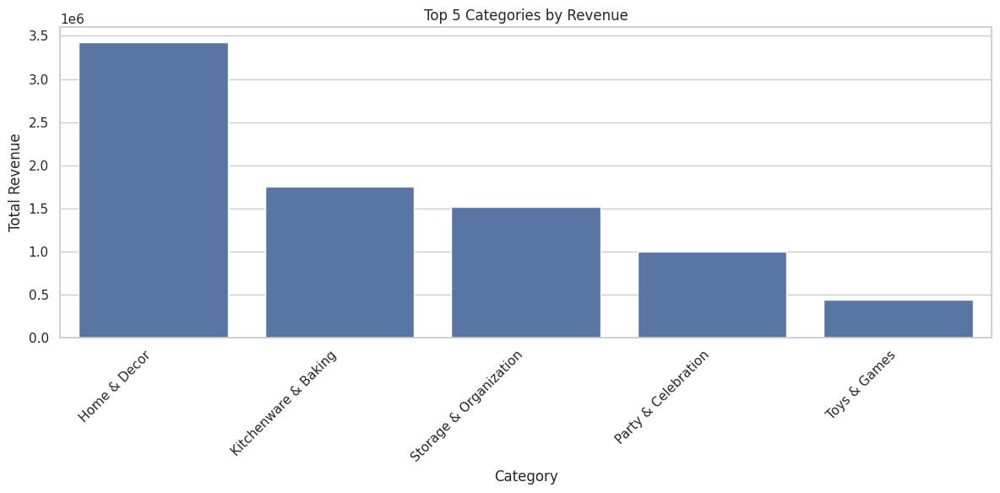

In [ ]:
# Sort categories by TotalRevenue in descending order and select the top 5
top_5_categories = category_sales.sort_values(by=['TotalRevenue'], ascending=False).head(5)

# Create a bar plot using Seaborn
plt.figure(figsize=(12, 6))
sns.barplot(x=top_5_categories.index, y=top_5_categories['TotalRevenue'])
plt.title('Top 5 Categories by Revenue')
plt.xlabel('Category')
plt.ylabel('Total Revenue')
plt.xticks(rotation=45, ha='right')  # Rotate x-axis labels for better readability
plt.tight_layout()
# Save it to png
plt.savefig('0.5_top_5_categories_by_revenue.png')
plt.show()

In [ ]:
# Use px to plot bar plot
fig = px.bar(
    top_5_categories,
    x=top_5_categories.index,
    y='TotalRevenue',
    title='Top 5 Categories by Revenue (Plotly)',
    labels={'index': 'Category', 'TotalRevenue': 'Total Revenue'}
)
# Save it to html
fig.write_html('0.5_top_5_categories_by_revenue.html')
fig.show()

In [ ]:
top_5_categories

,TotalSales,TotalRevenue
Category,,
Home & Decor,1784213,3.428020e+06
Kitchenware & Baking,843889,1.746808e+06
Storage & Organization,862661,1.519244e+06
Party & Celebration,571649,9.965247e+05
Toys & Games,282842,4.403408e+05


In [ ]:
# Get the rest of the TotalSales
other_total_price = category_sales['TotalSales'].sum() - top_5_categories['TotalSales'].sum()
# Get the rest of TotalRevenue
other_total_revenue = category_sales['TotalRevenue'].sum() - top_5_categories['TotalRevenue'].sum()
# Make a new record called others with index called OTHERS
All_Categories = pd.DataFrame({'TotalSales': [other_total_price], 'TotalRevenue': [other_total_revenue]}, index=['OTHERS'])
# Concate between other_total_price and top_5_categories
All_Categories = pd.concat([top_5_categories, All_Categories])
All_Categories.head(10)

,TotalSales,TotalRevenue
Home & Decor,1784213,3.428020e+06
Kitchenware & Baking,843889,1.746808e+06
Storage & Organization,862661,1.519244e+06
Party & Celebration,571649,9.965247e+05
Toys & Games,282842,4.403408e+05
OTHERS,1063732,1.482823e+06


In [ ]:
# Use px to plot pie plot and plot the rest as others
fig = px.pie(
    top_5_categories,
    names=top_5_categories.index,
    values='TotalRevenue',
    title='top_5_categories by Revenue (Plotly Pie Chart)'
)

fig = px.pie(
    top_5_categories,
    names=top_5_categories.index,
    values='TotalRevenue',
    title='top_5_categories by Revenue (Plotly Pie Chart)'
)
# Save it to html
fig.write_html('0.5_top_5_categories_by_revenue_pie_chart.html')
fig.show()

In [ ]:
# Use px to plot pie plot and plot the rest as others
fig = px.pie(
    All_Categories,
    names=All_Categories.index,
    values='TotalRevenue',
    title='All_Categoriess by Revenue (Plotly Pie Chart)'
)

fig = px.pie(
    All_Categories,
    names=All_Categories.index,
    values='TotalRevenue',
    title='All_Categories by Revenue (Plotly Pie Chart)'
)
# Save it to html
fig.write_html('0.4_All_Categories_by_revenue_pie_chart.html')
fig.show()

## **8.4 Observations**
- Top 5 `Categories`

| **No**       | **Category**                                | **Total Revenue**                                |
|-------------------|---------------------------------------------|-------------------------------------------------|
| **1**      | Home & Decor | 3.43M |
| **2**      | Kitchenware & Baking | 1.75M |
| **3**      | Storage & Organization | 1.52M |
| **4**      | Party & Celebration | 0.996M|
| **5**      | Toys $ Games |0.44M |



## **8.5 Second Approach using NLP**

In [ ]:
!pip install torch --upgrade

In [ ]:
import spacy
import pandas as pd

# Load spaCy model
nlp = spacy.load('en_core_web_sm')

# Define keywords for each category
category = {
    "Home & Decor": [
        "heart", "frame", "light", "wicker", "wooden", "picture", "glass", "decor", "sign", "doormat", "jar", "block",
        "zinc", "board", "candle", "hanging", "star", "scandinavian", "christmas", "angel", "bells", "clock", "chalkboard",
        "banner", "party", "mice", "poppy", "tea", "roses", "trellis", "cabinet", "photo", "shelf", "parasol", "bunting",
        "birdy", "rose", "cushion", "stocking", "bauble", "fairy", "tree", "vintage", "swallow", "bicycle", "feather", "moody",
        "sewing", "beaded", "owl", "magic", "heart-shaped", "wall", "jigsaw", "wreath", "mistletoe", "alarm", "bakelike",
        "chilli", "chocolate", "popcorn", "rotating", "victorian", "white", "gumball", "four", "grand",
        "chocolatecandle", "shed", "back", "front", "gymkhana", "buffalo", "turquoise", "green", "wash",
        "gazebo", "mirror", "hammock", "candleholder", "wrap", "bowl", "cup", "knob", "purse", "pen", "hat", "flags",
        "basil", "tin", "door", "enamel", 'home', 'mat', 'flannel', 'hook', 'soap', 't-light', 'porcelain', "placemat",
        "memory", "pompom", "curtain", "doorsign", "flowers", "plant", "plants", "holder", "lightbulb", "rainbow", "lamp",
        "quilt", "rug", "plush", "blanket", "throw", "pillow", "gnome", "teddy", "vase", "frame", "mirror", "statue",
        "photo", "decorative", "ice-cream", "patches", "vintage", "abstract", "swagat", "elephant", "pouffe", "clamshell",
        "dragonsblood", "floral", "level", "greetingcard", "tiaras", "earrings", "photo-frame", "geisha", "jewelled",
        "laquered", "cinderella", "rosette", "t-light", "grass-skirt", "hair-clip", "silver", "beads", "amber", "diamante",
        "crystal", "incense", "mobile", "match", "cactus", "match", "groovy", "magnets", "rosette", "pouffe", "jewels",
        'fruit','love','toast','mum', "nursery", "sombrero", "hairclips", "vanilla", "botanical", "childhood", "keep clean",
        "doggy", "cosy hour", "hawaiian", "greeting card", "chrysanthemum", "space cadet", "magazine rack", "french",
        "hilda", "beach hut", "stripy", "lily brooch", "packing charge", "teatime", "butterfly", "dollcraft", "daisies",
        "envelope", "daisy", "jean-paul",'bin','shoe','image','boxes','bath','ivory','screen','ipod'
    ],
    "Kitchenware & Baking": [
        "cake", "cakestand", "pantry", "teacup", "saucer", "recipe", "mould", "jelly", "jam", "baking", "scales", "trinket",
        "spice", "tins", "bowls", "cookie", "cutters", "plates", "stand", "cups", "bread", "measuring", "egg", "teapot",
        "biscuit", "money", "mushroom", "milk", "sugar", "coffee", "cupcakes", "muffins", "bottle", "oven", "marshmallows",
        "regency", "set", "box", "yellow", "retrospot", 'sponge', 'plate', 'tray', 'straw', 'toastrack', 'dish', 'cover',
        "beaker", "kitchen", "spoon", "rest", "apron", "can", "tumbler", "jar", "squeezer", "candlepot", "coaster", "mop",
        "spoons", "rests",'stwars','tissue','tissues','jars','tube','planet','doughnuts','feeding','strawberry','candy','poncho'
    ],
    "Party & Celebration": [
        "party", "bunting", "napkin", "paper", "chain", "kit", "sweetheart", "plates", "cups", "doilies", "cookie", "birthday",
        "picnic", "banner", "tea", "time", "confusing", "notebooks", "cupcake", "skittles", "soldier", "candles", "red", "mac",
        "apples", "gift", "vintage", "celebration", "balloons", "traditional", "naughts", "crosses", 'garland', 'tissue',
        'swords', "confetti", "tiara", "ball", "pins", "glow", "glows", "parties" ,'gloss','hand','card'
    ],
    "Storage & Organization": [
        "storage", "box", "container", "bag", "snack", "plasters", "popcorn", "dominoes", "drawer", "chest", "pot",
        "wallet", "tidy", "memo", "list", "basket", "knob", "mini", "crackers", "bottles", "crate", "nesting",
        "organizer", "shelf", "dividers", "jumbo", "alphabet", "pink", "paisley", "suki", "lunch", "ceramic", "rex",
        "purple", "drawerknob", "acrylic", "edwardian", "mac", "hairclip", "washbag", 'folding','bucket','sandlewood'
    ],
    "Craft & Stationery": [
        "paper", "chain", "ribbon", "craft", "trinket", "felt", "butterfly", "hearts", "flowers", "decoration",
        "fan", "sewing", "cushion", "doll", "crayons", "coloring", "wooden", "school", "stationery", "vintage",
        "clay", "modelling", "pens", "pencils", "stamps", "ink", "notebooks", "babushka", "swallows", "bib", "ring",
        "sack", "cutlery", "first", "coathanger", "toothpaste", "frying", "erasers", 'bunnies', 'calculator', 'ruler',
        'stars', 'calendar', "charlie+lola", "doorsign", "patch", "notebook", "tape", "sketchbook", "journal", "letter",'letters'
        "scissor", "scissors", "iron", "art", "sticker", "keyring", "band", "pins", "tile", "coaster", "sign", "message",'jar','meter'
    ],
    "Toys & Games": [
        "cards", "game", "popcorn", "holder", "dominoes", "harmonica", "dinosaur", "toy", "birthday", "spaceboy",
        "strongman", "gliders", "mice", "dolly", "princess", "skittles", "soldiers", "mini", "egg", "crackers", "cookie",
        "play", "fun", "puzzle", "tops", "feltcraft", "skulls", "water", "transfer", "tattoos", 'carriage',
        'bubbles', 'eggs', 'crawly', "creepy", "disc", "wheelbarrow", "globe", "fly", "swat", "dog", "dogs", "monkey",
        "monkeys", "hen", "ninja", "rabbits", "frog", "teddy", "helicopter", "dolphin", "seahorse"
    ],
    "Gardening & Outdoor": [
        "gardener", "kneeling", "pad", "tea", "garden", "ladder", "watering", "planter", "flowerpot", "outdoor", "tools",
        "seeds", "gloves", "herb", "magnet", "fridge", "luggage", "tag",'shell','cadet','string'
    ],
    "Travel & Accessories": [
        "lunch", "box", "woodland", "alphabet", "charlotte", "london", "vintage", "leaf", "dolly", "spaceboy", "picnic",
        "playhouse", "skull", "bag", "passport", "wallet", "kit", "manual", "umbrella", "bracelet", "doorstop",
        "stickers", "warmer", "case", "magnet", "disco", "fob", "pencil", "microwave", "torch", "screwdriver",'scent'
        "raffia", "pumpkin", "blossom", "balloon", "retro", "coat", "jungle", "mug", "key", "luggage", "earring", "necklace",
        "pendant", "headphones", "glasses", "watch", "phone", "charm", "frame", "scarf", "jacket", "hat", "glove", "sock",
        "slipper", "shoes", "belt", "sunglasses",'bank', 'charge','blue' ,'gold','lives','braclet','rasta','tuscan','treasure'
    ],
    "Christmas & Seasonal": [
        "christmas", "star", "tree", "decor", "gifts", "parasol", "scandinavian", "wooden", "zinc", "angel", "bells",
        "sleigh", "top", "ribbons", "vintage", "fairy", "bunting", "stocking", "bauble", "t-light", "present",
        "mistletoe", "wreath", "card", "holder", "wood", "metal", "lights", "holiday",'eastern','rabbit'
    ],
    "Hot Water Bottles": [
        "scottie", "postage", "poorly", "knitting", "flower", "fawn", "union", "chick", "bird", "charlie", "lola"
    ],
    "Mugs & Drinkware": [
        "cup", "tea", "mug", "coffee", "tumbler", "beaker", "travel", "water", "bottle", "saucer", "drink", "glass",
        "mug", "flask", "jug", "steins",'col'
    ],
    "Books & Stationery": [
        "book", "stationery", "notebook", "sketchbook", "planner", "journal", "diary", "pencil", "pen", "ruler", "glue",
        "scissors", "sharpener", "eraser", "markers", "highlighter", "stamps", "stickers", "tape",'candlestick'
        "chalk", "clips",'scissor','chinese', 'color','magazine','colour','paperweight', 'blackboard' ,'flag','fee','samples'
    ]
}


# Preprocess function using spaCy
def preprocess(text):
    # Process the text with spaCy
    doc = nlp(text.lower())  # Convert to lowercase
    # Return lemmatized tokens (excluding stopwords and non-alphabetic tokens)
    tokens = [token.lemma_ for token in doc if not token.is_stop and token.is_alpha]
    return tokens

# Function to categorize description based on keywords
def categorize_description(tokens):
    for category, keywords in categories_keywords.items():
        if any(keyword in tokens for keyword in keywords):
            return category
    return 'Other'  # If no match is found

# Apply preprocessing and categorization
E_Commerce_df_copy['cleaned_description'] = E_Commerce_df_copy['Description'].apply(preprocess)
E_Commerce_df_copy['Category'] = E_Commerce_df_copy['cleaned_description'].apply(categorize_description)

# View the results
print(E_Commerce_df_copy[['description', 'category']])


# 📌 **9. Task 6 : Geographical Analysis**
**Description**: Analyze sales distribution by country and identify top revenue-generating countries.

**Requirments**:
-  Calculate total revenue by country.
-  Create a bar plot of the top 10 countries by revenue.
-  Calculate the percentage of sales from the top 3 countries.

**Responsible:** Karen Emad


## **9.1 Calculate total revenue by country.**


In [ ]:
country_revenue = E_Commerce_df_copy.groupby('Country')['TotalPrice'].sum().reset_index()
country_revenue

,Country,TotalPrice
0,Australia,1.362376e+05
1,Austria,8.700269e+03
2,Bahrain,7.309867e+02
3,Belgium,3.666871e+04
4,Brazil,1.037733e+03
5,Canada,3.079755e+03
6,Channel Islands,1.940784e+04
7,Cyprus,1.262137e+04
8,Czech Republic,7.898231e+02
9,Denmark,1.830103e+04



## **9.2 Create a bar plot of the top 10 countries by revenue.**


In [ ]:
# Sort countries by revenue in descending order
country_revenue = country_revenue.sort_values(by='TotalPrice', ascending=False)
country_revenue.head(10)

,Country,TotalPrice
36,United Kingdom,8.108656e+06
24,Netherlands,2.813019e+05
10,EIRE,2.675665e+05
14,Germany,2.013207e+05
13,France,1.841983e+05
0,Australia,1.362376e+05
31,Spain,5.443190e+04
33,Switzerland,5.225588e+04
20,Japan,3.741637e+04
32,Sweden,3.694925e+04


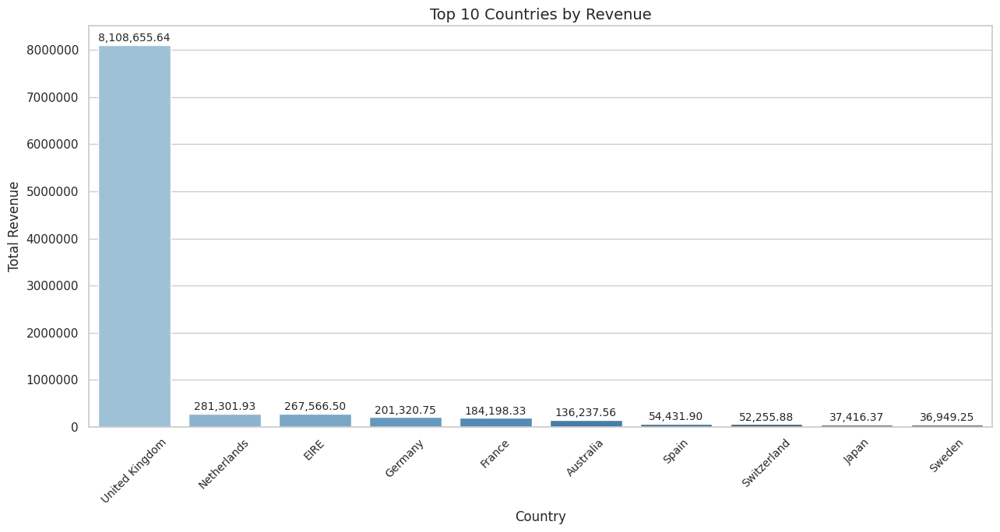

In [ ]:
import seaborn as sns

top_10_countries = country_revenue.head(10)

plt.figure(figsize=(13, 7))

sns.barplot(
    x='Country',
    y='TotalPrice',
    data=top_10_countries,
    palette='Blues_d',
    hue='Country',  # Set hue to x variable
    legend=False    # Disable legend
)

# Turn off scientific notation
plt.ticklabel_format(style='plain', axis='y')


# Add labels and title
plt.xlabel('Country', fontsize=12)
plt.ylabel('Total Revenue', fontsize=12)
plt.title('Top 10 Countries by Revenue', fontsize=14)
plt.xticks(rotation=45, fontsize=10)

# Add data labels
for index, value in enumerate(top_10_countries['TotalPrice']):
    plt.text(index, value + 0.01 * max(top_10_countries['TotalPrice']),
             f'{value:,.2f}', ha='center', fontsize=10)

plt.tight_layout()
# Save it to png
plt.savefig('0.6_top_10_countries_by_revenue.png')
plt.show()

In [ ]:
# Use PX to plot the Total revenue by Country Total Revenue'}
fig = px.bar(
    top_10_countries,
    x='Country',
    y='TotalPrice',
    title='Top 10 Countries by Revenue' ,
    labels={'Country': 'Country', 'TotalPrice': 'Total Revenue'}
)

# Save it to html
fig.write_html('0.6_top_10_countries_by_revenue.html')
fig.show()

## **9.3 Calculate the percentage of sales from the top 3 countries.**

In [ ]:
top_3_revenue = country_revenue.head(3)['TotalPrice'].sum()
total_revenue = country_revenue['TotalPrice'].sum()
top_3_percentage = (top_3_revenue / total_revenue) * 100

print(f"Percentage of sales from the top 3 countries: {top_3_percentage:.2f}%")

Percentage of sales from the top 3 countries: 90.05%


## **9.4 Observations**
- `Country` : is **highly unbalanced** with 92,591 (86.2%) of the entries  concentrated in one country which is `United Kingdom`
- Top 3 `Countries` are United Kingdom, Netherlands, EIRE
- Percentage `Sales` from top 3 countries  is 90.31%

# 📌 **10. Task 7 : Customer Behavior Analysis**
**Description**: Analyze customer behavior based on order quantity, sales, and purchasing patterns.

**Requirments**:
-  Plot the distribution of order quantities.
-  Create a scatter plot of Quantity vs. TotalPrice.
-  Calculate and plot average daily sales throughout the week.

**Responsible:** Dina Fakhry


## **10.1 Plot the distribution of order quantities.**

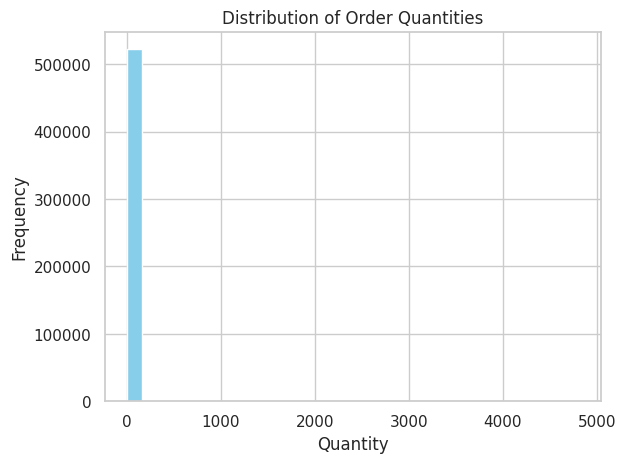

In [ ]:
# Plot the distribution of order quantities
E_Commerce_df_copy['Quantity'].plot(kind='hist', bins=30, color='skyblue')
plt.title('Distribution of Order Quantities')
plt.xlabel('Quantity')
plt.ylabel('Frequency')
# Save it to png
plt.savefig('07.1_distribution_of_order_quantities.png')
plt.show()

In [ ]:
# Use PX to plot frequency vs quantity
fig = px.histogram(E_Commerce_df_copy, x='Quantity', nbins=30, title='Distribution of Order Quantities')
# Save it to html
fig.write_html('07.1_distribution_of_order_quantities.html')
fig.show()

## **10.2 Create a scatter plot of Quantity vs. TotalPrice.**


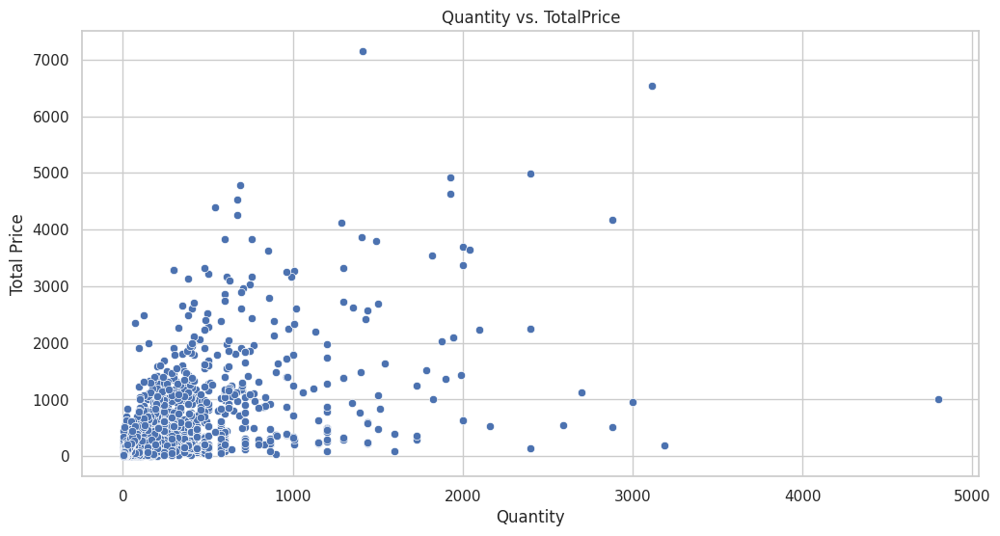

✅ Quantity vs. TotalPrice plotted successfully.


In [ ]:
# Create a scatter plot of Quantity vs TotalPrice
plt.figure(figsize=(12, 6))
sns.scatterplot(x='Quantity', y='TotalPrice', data=E_Commerce_df_copy, color='b')
plt.title('Quantity vs. TotalPrice')
plt.xlabel('Quantity')
plt.ylabel("Total Price")
plt.grid(True)
# save it as png
plt.savefig('07.2_quantity_vs_total_price.png')
plt.show()
print("✅ Quantity vs. TotalPrice plotted successfully.")

In [ ]:
# Use PX the scatter plot
fig = px.scatter(E_Commerce_df_copy, x='Quantity', y='TotalPrice', title='Quantity vs. TotalPrice')
# Save it to html
fig.write_html('07.2_quantity_vs_total_price.html')
fig.show()

## **10.3 Calculate and plot average daily sales throughout the week.**

In [ ]:
# Extract the day of the week
E_Commerce_df_copy['DayOfWeek'] = E_Commerce_df_copy['InvoiceDate'].dt.day_name()
avg_daily_sales = E_Commerce_df_copy.groupby('DayOfWeek')['TotalPrice'].mean()

# Ensure the days are in the correct order
days_order = [ 'Saturday', 'Sunday','Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday']
avg_daily_sales = avg_daily_sales.reindex(days_order)
print("Average Daily Sales:")
print(avg_daily_sales)
print("✅ Average daily sales calculated successfully.")

Average Daily Sales:
DayOfWeek
Saturday           NaN
Sunday       12.510393
Monday       17.557325
Tuesday      19.465504
Wednesday    18.898155
Thursday     20.671076
Friday       18.690425
Name: TotalPrice, dtype: float64
✅ Average daily sales calculated successfully.


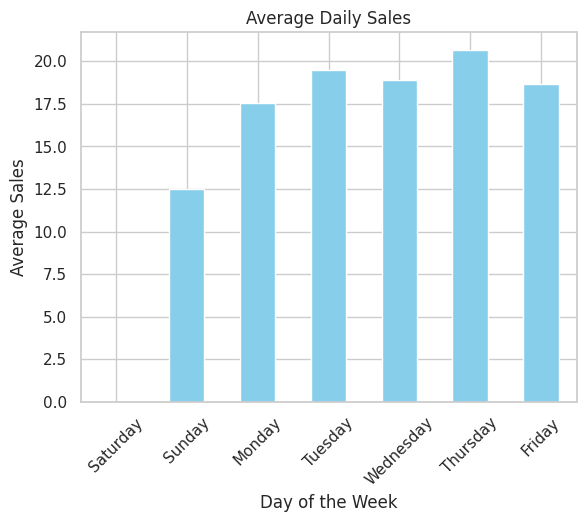

In [ ]:
avg_daily_sales.plot(kind='bar', color='skyblue', title='Average Daily Sales')
plt.xlabel('Day of the Week')
plt.ylabel('Average Sales')
plt.xticks(rotation=45)
# Save it to png
plt.savefig('07.3_average_daily_sales_bar_plot.png')
plt.show()

**10.4 Extra : Calculating and plotting average daily sales through the data set**

In [ ]:
# Calculate and plot average daily sales throughout the week
# Calculate the average daily sales
daily_sales = E_Commerce_df_copy.groupby(E_Commerce_df_copy['InvoiceDate'].dt.date)['TotalPrice'].mean()
print("Average Daily Sales:")
print(daily_sales)
print("✅ Average daily sales calculated successfully.")

Average Daily Sales:
InvoiceDate
2010-12-01    18.057011
2010-12-02    22.728778
2010-12-03    18.169108
2010-12-05    11.549309
2010-12-06    12.699440
                ...    
2011-12-05    14.410302
2011-12-06    16.354113
2011-12-07    30.209098
2011-12-08    15.287133
2011-12-09    17.044563
Name: TotalPrice, Length: 305, dtype: float64
✅ Average daily sales calculated successfully.


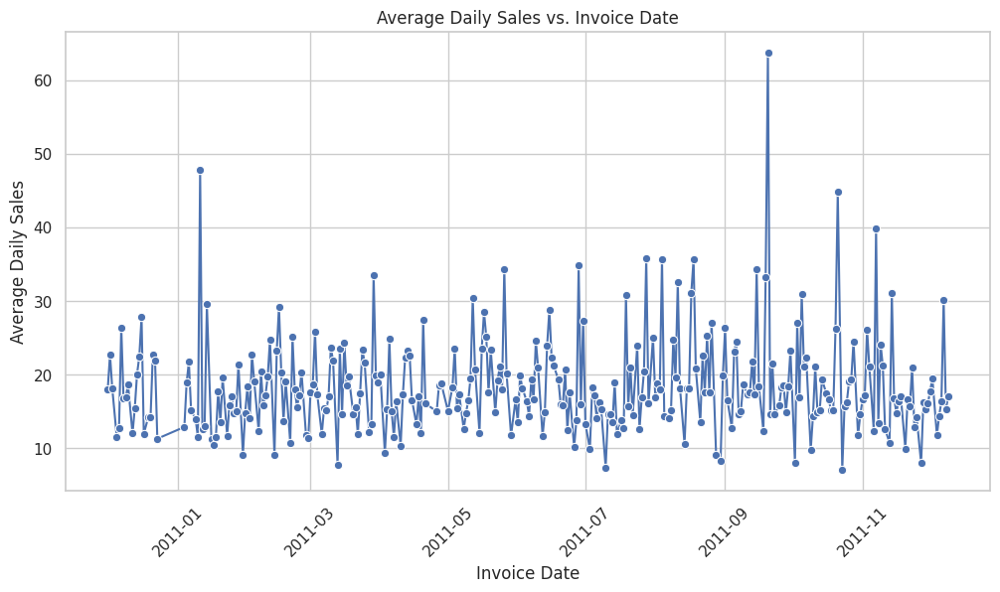

✅ Average daily sales plotted successfully.


In [ ]:
# Plot Average Sales vs InvoiceDate
plt.figure(figsize=(12, 6))
sns.lineplot(x=daily_sales.index, y=daily_sales.values, marker='o', color='b')
plt.title('Average Daily Sales vs. Invoice Date')
plt.xlabel('Invoice Date')
plt.ylabel('Average Daily Sales')
plt.xticks(rotation=45)
plt.grid(True)
# save it as png
plt.savefig('07.3_average_daily_sales_vs_invoice_date.png')
plt.show()
print("✅ Average daily sales plotted successfully.")

In [ ]:
# Use PX to plot the average daily sales
fig = px.line(x=daily_sales.index, y=daily_sales.values, title='Average Daily Sales vs. Invoice Date')
fig.update_layout(xaxis_title='Invoice Date', yaxis_title='Average Daily Sales')
# Add Slide Bar
fig.update_xaxes(rangeslider_visible=True)
# Save it to html
fig.write_html('07.3_average_daily_sales_vs_invoice_date.html')
fig.show()

# 📌 **11. Task 8 : Moving Average Forecast**
**Description**: Implement a basic moving average forecast for sales based on past data.

**Requirments**:
-  Prepare daily sales data.
-  Calculate a 7-day moving average of sales.
-  Plot actual sales vs. moving average for the last 3 months.

**Responsible:** Basel Amr


## **11.1 Prepare daily sales data.**


In [ ]:
# Prepare daily sales data
daily_sales = E_Commerce_df_copy.groupby(E_Commerce_df_copy['InvoiceDate'].dt.date)['TotalPrice'].sum()
print("Daily Sales:")
print(daily_sales)
print("✅ Daily sales data prepared successfully.")

Daily Sales:
InvoiceDate
2010-12-01    54676.628120
2010-12-02    45957.589540
2010-12-03    38845.553384
2010-12-05    30062.851426
2010-12-06    47851.491216
                  ...     
2011-12-05    75769.365510
2011-12-06    52513.055244
2011-12-07    71233.052140
2011-12-08    73898.002805
2011-12-09    27561.058938
Name: TotalPrice, Length: 305, dtype: float64
✅ Daily sales data prepared successfully.


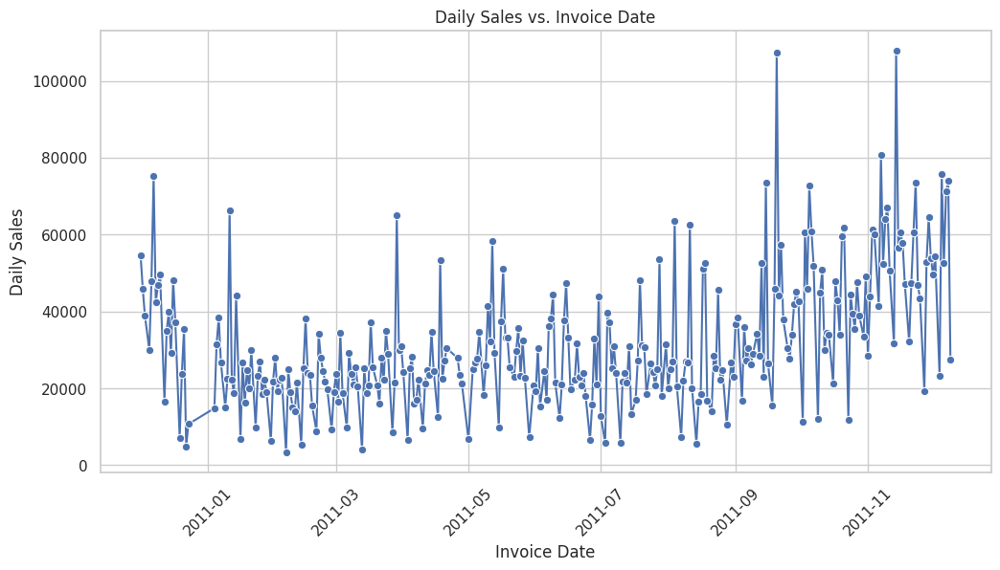

✅ Daily sales data plotted successfully.


In [ ]:
# Plot daily sales data
plt.figure(figsize=(12, 6))
sns.lineplot(x=daily_sales.index, y=daily_sales.values, marker='o', color='b')
plt.title('Daily Sales vs. Invoice Date')
plt.xlabel('Invoice Date')
plt.ylabel('Daily Sales')
plt.xticks(rotation=45)
plt.grid(True)
# save it as png
plt.savefig('08.1_daily_sales_vs_invoice_date.png')
plt.show()
print("✅ Daily sales data plotted successfully.")

## **11.2 Calculate a 7-day moving average of sales.**


In [ ]:
# Calculate a 7-day moving average of sales
moving_average = daily_sales.rolling(window=7).mean()
print("Moving Average:")
print(moving_average)
print("✅ Moving average calculated successfully.")


Moving Average:
InvoiceDate
2010-12-01             NaN
2010-12-02             NaN
2010-12-03             NaN
2010-12-05             NaN
2010-12-06             NaN
                  ...     
2011-12-05    53446.214134
2011-12-06    53399.095783
2011-12-07    54367.606868
2011-12-08    57241.609171
2011-12-09    54088.245219
Name: TotalPrice, Length: 305, dtype: float64
✅ Moving average calculated successfully.


## **11.3 Plot actual sales vs. moving average for the last 3 months.**

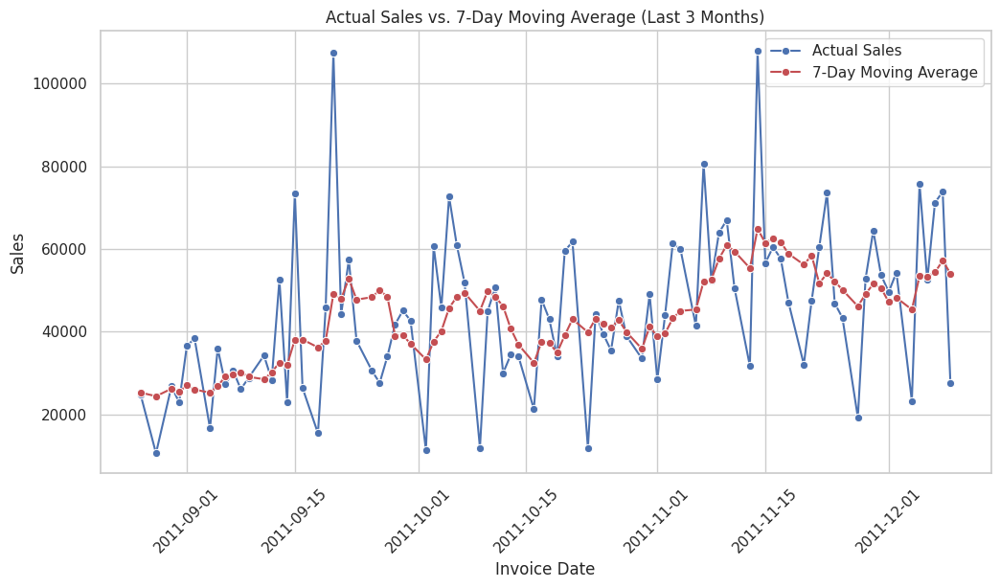

✅ Actual sales vs. moving average plotted successfully.


In [ ]:
# plot actual sales vs a moving average for the last 3 month
plt.figure(figsize=(12, 6))
sns.lineplot(x=daily_sales.index[-90:], y=daily_sales.values[-90:], marker='o', color='b', label='Actual Sales')
sns.lineplot(x=daily_sales.index[-90:], y=moving_average.values[-90:], marker='o', color='r', label='7-Day Moving Average')
plt.title('Actual Sales vs. 7-Day Moving Average (Last 3 Months)')
plt.xlabel('Invoice Date')
plt.ylabel('Sales')
plt.xticks(rotation=45)
plt.grid(True)
plt.legend()
# save it as png
plt.savefig('08.3_actual_sales_vs_moving_average_last_3_months.png')
plt.show()
print("✅ Actual sales vs. moving average plotted successfully.")

In [ ]:
# Using PX to plot average sales vs actual sales

fig = px.line(title='Actual Sales vs. 7-Day Moving Average (Last 3 Months)')
# Add Acutal Sales Line
fig.add_scatter(
    x=daily_sales.index[-90:],
    y=daily_sales.values[-90:],
    mode='lines',
    name='Actual Sales',
    line=dict(color='blue')
)

# Add 7-Day Moving Average Line
fig.add_scatter(
    x=daily_sales.index[-90:],
    y=moving_average.values[-90:],
    mode='lines',
    name='7-Day Moving Average',
    line=dict(color='red')


)

# Update layout
fig.update_layout(
    xaxis_title='Invoice Date',
    yaxis_title='Sales',
    legend_title='blue'
)

# Add slider for the date range
fig.update_xaxes(rangeslider_visible=True)

# Add legend for actual sales


fig.update_layout(
    legend=dict(
        yanchor="top",
        y=0.99,
        xanchor="left",
        x=0.01
    )
)



# Save the plot to an HTML file
fig.write_html('08.3_actual_sales_vs_moving_average_last_3_months.html')

# Show the plot
fig.show()
print("✅ Actual sales vs. moving average plotted successfully.")

✅ Actual sales vs. moving average plotted successfully.


# 📌 **12. Task 9 : Summary Dashboard Creation**
**Description**: Create a dashboard that summarizes key insights through visualizations.

**Requirments**:

Create a 2x2 subplot with:
  1.   Monthly sales trend
  2.   Top 5 products by revenue
  3.   Customer segment distribution
  4.   Top 5 countries by revenue.

**Responsible:** All Team Members


## **12.1 Monthly sales trend**


In [ ]:
# Make a list of plots to make it easy when we plot our data
plot_list = []
# plot Monthly sales trend

fig = px.line(monthly_sales, x=monthly_sales.index, y=monthly_sales.values, title='Monthly Sales Trends',markers=True)
fig.update_xaxes(title_text='Month')
fig.update_yaxes(title_text='Total Sales')
# Making annotation for the higest and lowest value on the plot
# Highest Sales
fig.add_annotation(
    x=highest_sales_month,
    y=monthly_sales.max(),
    text=f'Highest Sales: {highest_sales_month.strftime("%Y-%m")}',
    showarrow=True,
    arrowhead=1,
    arrowsize=1,
    arrowwidth=1,
    arrowcolor='black',
    font=dict(size=12, color='black'),
    bgcolor='white',
    bordercolor='black',
    borderwidth=2,
    borderpad=4,
    xanchor='left',
    yanchor='bottom',
    xshift=10,
    yshift=10
)
# Lowest Sales
fig.add_annotation(
    x=lowest_sales_month,
    y=monthly_sales.min(),
    text=f'Lowest Sales: {lowest_sales_month.strftime("%Y-%m")}',
    showarrow=True,
    arrowhead=1,
    arrowsize=1,
    arrowwidth=1,
    arrowcolor='red',
    font=dict(size=12, color='red'),
    bgcolor='white',
    bordercolor='red',
    borderwidth=2,
    borderpad=4,
    xanchor='left',
    yanchor='bottom',
    xshift=10,
    yshift=10
)
# Add slider for monthly_sales.index
fig.update_layout(
    xaxis=dict(
        rangeselector=dict(
            buttons=list([
                dict(count=1, label="1m", step="month", stepmode="backward"),
                dict(count=6, label="6m", step="month", stepmode="backward"),
                dict(count=1, label="YTD", step="year", stepmode="todate"),
                dict(count=1, label="1y", step="year", stepmode="backward"),
                dict(step="all")
            ])
        ),
        rangeslider=dict(visible=True),
        type="date"
    )
)
# Show the figure
fig.show()
# Add it to the list
plot_list.append(fig)
print("✅ Monthly sales trend plotted successfully.")

✅ Monthly sales trend plotted successfully.


## **12.2 Top 5 products by revenue**


In [ ]:
# Use px to plot bar plot
fig = px.bar(
    top_5_categories,
    x=top_5_categories.index,
    y='TotalRevenue',
    title='Top 5 Categories by Revenue (Plotly)',
    labels={'index': 'Category', 'TotalRevenue': 'Total Revenue'}
)
# Show the figure
fig.show()
# Add it to the list
plot_list.append(fig)
print("✅ Top 5 products by revenue plotted successfully.")

✅ Top 5 products by revenue plotted successfully.


## **12.3 Customer segment distribution**


In [ ]:
fig = px.bar(segment_counts, x='Segment', y='Count', title='Segment Distribution (Bar Chart - Plotly)', color='Segment')
# Show the figure
fig.show()
# Add it to the list
plot_list.append(fig)
print("✅ Customer segment distribution plotted successfully.")

✅ Customer segment distribution plotted successfully.


## **12.4 Top 5 countries by revenue.**

In [ ]:
top_5_countries = country_revenue.head(5)
# Use PX to plot the Total revenue by Country Total Revenue'}
fig = px.bar(
    top_5_countries,
    x='Country',
    y='TotalPrice',
    title='Top 10 Countries by Revenue' ,
    labels={'Country': 'Country', 'TotalPrice': 'Total Revenue'}
)
# Show the figure
fig.show()
# Add it to the list
plot_list.append(fig)
print("✅ Top 5 countries by revenue plotted successfully.")



✅ Top 5 countries by revenue plotted successfully.


## **12.5 Create a 2x2 subplot with the figures**

In [ ]:
# Use plot_line list to plot 2x2 subplot

# Create a 2x2 subplot layout
fig = make_subplots(
    rows=2,
    cols=2,
    subplot_titles=[plot.layout.title.text for plot in plot_list]
)
# Add each plot to the subplot
for i, plot in enumerate(plot_list):
    for figure in plot.data:
        row = (i // 2) + 1  # Determine the row
        col = (i % 2) + 1   # Determine the column
        fig.add_trace(figure, row=row, col=col)

# Update layout for better appearance
fig.update_layout(
    height=800,
    width=1000,
    title_text="2x2 Subplots of Plotly Express Plots",
    showlegend=False
)
# Save as html
fig.write_html('09.5_2x2_subplots_of_plotly_express_plots.html')
# Show the combined subplot
fig.show()

# 📌 **13. Task 10 : Optimize Data Processing**
**Description**: Optimize a computationally intensive task using vectorized operations.

**Requirments**:
-  Implement a task using loops.
-  Implement the same task using vectorized operations.
-  Compare and report performance differences.

**Responsible:** All Team Members


## **13.1 Implement a task using loops.**


In [ ]:
# Implement task using loops assume we want to get the sum of all the elements in Quantity Col
Sum_Quantity_For_Loop = 0
# Calculate the time take by this operation
# Start time
start_time = time.time()
Quantity_col = E_Commerce_df_copy['Quantity'].to_list()
# Loop through the Quantity col
for i in range(len(Quantity_col)):
    Sum_Quantity_For_Loop += Quantity_col[i]
# End time
end_time = time.time()
# Time taken by the operation
Time_Taken_By_ForLoop = end_time-start_time
# Print the time taken
print(f"The time taken by the operation is {Time_Taken_By_ForLoop} seconds")
print(f"The sum of all the elements in Quantity Col is {Sum_Quantity_For_Loop}")

The time taken by the operation is 0.10683202743530273 seconds
The sum of all the elements in Quantity Col is 5408986


## **13.2 Implement the same task using vectorized operations.**


In [ ]:
# Implement task using vectorized operations assume we want to get the sum of all the elements in Quantity Col
start_time = time.time()
# Get the sum of the quantity col
start_time = time.time()
Sum_Quantity_Vectorized = E_Commerce_df_copy['Quantity'].sum()
end_time = time.time()
# Time taken by the operation
Time_Taken_By_Vectorized = end_time-start_time
print(f"The time taken by the operation is {Time_Taken_By_Vectorized} seconds")
print(f"The sum of all the elements in Quantity Col is {Sum_Quantity_Vectorized}")

The time taken by the operation is 0.0016105175018310547 seconds
The sum of all the elements in Quantity Col is 5408986


## **13.3 Compare and report performance differences.**

In [ ]:
# Compare Time taken
print("Comparing Time")
print(f"The Summition of for loop operation is {Time_Taken_By_ForLoop} seconds")
print(f"The Summition of vectorized operation is {Time_Taken_By_Vectorized} seconds")
print("-----------------------------------------------------------------------")
# Compare Values
print("Comparing Values")
print(f"The sum of all the elements in Quantity Col using for loop is {Sum_Quantity_For_Loop}")
print(f"The sum of all the elements in Quantity Col using vectorized operation is {Sum_Quantity_Vectorized}")
print("-----------------------------------------------------------------------")
# Summary
print("Summary")
print(f"The vectorized operation is {Time_Taken_By_ForLoop/Time_Taken_By_Vectorized} times faster than the for loop operation")

Comparing Time
The Summition of for loop operation is 0.10683202743530273 seconds
The Summition of vectorized operation is 0.0016105175018310547 seconds
-----------------------------------------------------------------------
Comparing Values
The sum of all the elements in Quantity Col using for loop is 5408986
The sum of all the elements in Quantity Col using vectorized operation is 5408986
-----------------------------------------------------------------------
Summary
The vectorized operation is 66.3339748334567 times faster than the for loop operation


# 📌 **14. Task 11 : Report Generation**
**Description**: Generate a summary report with key insights and recommendations.

**Requirments**:
-  Summarize overall revenue, top-selling products, best customer segments, and countries.
-  Provide insights from time series analysis and recommendations.


**Responsible:** All Team Members


## **14.1 Summarize overall revenue, top-selling products, best customer segments, and countries.**

In [ ]:
# Summarize overall revenue, top-selling products, best customer segments, and countries
# Overall Revenue
total_revenue = E_Commerce_df_copy['TotalPrice'].sum()
print(f"Total Revenue: ${total_revenue}")

# Top selling products
top_selling_products = E_Commerce_df_copy.groupby('Description')['TotalPrice'].sum().sort_values(ascending=False).head(1)
print("Top Selling Products:")
print(top_selling_products)

# Best two customers
best_customers = E_Commerce_df_copy.groupby('CustomerID')['TotalPrice'].sum().sort_values(ascending=False).head(2).to_list()
print(f"Best Customers: Value {best_customers[1]}")


# Best Country
best_country = E_Commerce_df_copy.groupby('Country')['TotalPrice'].sum().sort_values(ascending=False).head(1)
print("Best Country:")
print(best_country)

Total Revenue: $9613760.13734643
Top Selling Products:
Description
WHITE HANGING HEART T-LIGHT HOLDER    106236.72
Name: TotalPrice, dtype: float64
Best Customers: Value 276496.094466772
Best Country:
Country
United Kingdom    8.108656e+06
Name: TotalPrice, dtype: float64


## **14.2 Provide insights from time series analysis and recommendations.**

- Focus on top-performing product categories and countries.
- Develop targeted marketing campaigns for high-value customer segments.
- Monitor sales trends for better inventory management.


# 📌 **15. Task 12 : Time Series Forecasting with ARIMA**

## **15.1 Split dataset into training dataset, validation dataset and test dataset**

In [ ]:
#  Aggregate date by month
monthly_sales = E_Commerce_df_copy.resample('ME', on='InvoiceDate')['TotalPrice'].sum()
print("Monthly Sales:")
print(monthly_sales)
print("✅ Monthly sales calculated successfully.")

# Split data set 80% training dataset   10% validation dataset  10% test dataset
train_size = int(len(monthly_sales) * 0.8)
validation_size = int(len(monthly_sales) * 0.1)
test_size = len(monthly_sales) - train_size - validation_size
train_data, validation_data, test_data = monthly_sales[:train_size], monthly_sales[train_size:train_size+validation_size], monthly_sales[train_size+validation_size:]
print("✅ Data split successfully.")

Monthly Sales:
InvoiceDate
2010-12-31    7.188996e+05
2011-01-31    5.728095e+05
2011-02-28    4.869295e+05
2011-03-31    6.618640e+05
2011-04-30    4.957723e+05
2011-05-31    7.113569e+05
2011-06-30    6.777346e+05
2011-07-31    6.650856e+05
2011-08-31    7.037135e+05
2011-09-30    1.008360e+06
2011-10-31    1.077179e+06
2011-11-30    1.405803e+06
2011-12-31    4.282523e+05
Freq: ME, Name: TotalPrice, dtype: float64
✅ Monthly sales calculated successfully.
✅ Data split successfully.


In [ ]:
# Import Arima and mean_Squared_error
from statsmodels.tsa.arima.model import ARIMA
from sklearn.metrics import mean_squared_error
import numpy as np
# Build ARIMA model to forcast next
# Fit Arima Model
model = ARIMA(train_data, order=(1, 1, 1))
model_fit = model.fit()
print("✅ Arima model fit successfully.")

# Validate the model
forecast = model_fit.forecast(steps=len(validation_data))
print("✅ Forecast generated successfully.")

# Evaluate the model
mse = mean_squared_error(validation_data, forecast)
rmse = np.sqrt(mse)
print(f"MSE: {mse}")
print(f"RMSE: {rmse}")

✅ Arima model fit successfully.
✅ Forecast generated successfully.
MSE: 27851603034.07624
RMSE: 166887.99547623622


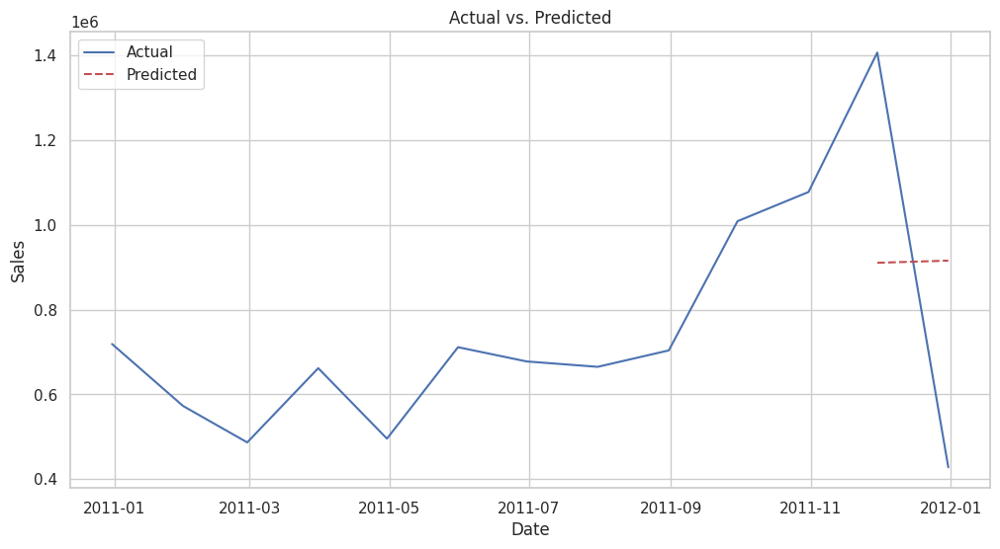

✅ Actual vs. predicted plotted successfully.


In [ ]:
# Plot y_test vs y_predicted in test dataset
plt.figure(figsize=(12, 6))
plt.plot(monthly_sales.index, monthly_sales.values, label='Actual', color='b')
forecast = model_fit.forecast(steps=len(test_data))
plt.plot(test_data.index, forecast, label='Predicted', color='r', linestyle='--')
plt.title('Actual vs. Predicted')
plt.xlabel('Date')
plt.ylabel('Sales')
plt.legend()
plt.grid(True)
# save it as png
plt.savefig('15.1_actual_vs_predicted.png')
plt.show()
print("✅ Actual vs. predicted plotted successfully.")

In [ ]:
# Forecast for next year
forecast = model_fit.forecast(steps=12)
print("Forecast:")
print(forecast)
print("✅ Forecast generated successfully.")

# Plot the results using PX
fig = px.line(
    x=monthly_sales.index,
    y=monthly_sales.values,
    title='Monthly Sales Forecast',
    labels={'x': 'Date', 'y': 'Sales'}
)
fig.add_scatter(
    x=forecast.index,
    y=forecast.values,
    mode='lines',
    name='Forecast',
    line=dict(color='red', dash='dash')
)
fig.update_layout(
    xaxis_title='Date',
    yaxis_title='Sales',
    legend_title='blue'
)
# Add Slide Bar
fig.update_xaxes(rangeslider_visible=True)

# Save as html
fig.write_html('15.1_monthly_sales_forecast.html')
# Show the plot
fig.show()
print("✅ Forecast plotted successfully.")

Forecast:
2011-10-31    910291.353998
2011-11-30    915380.388055
2011-12-31    915116.306024
2012-01-31    915130.009866
2012-02-29    915129.298741
2012-03-31    915129.335643
2012-04-30    915129.333728
2012-05-31    915129.333828
2012-06-30    915129.333822
2012-07-31    915129.333823
2012-08-31    915129.333823
2012-09-30    915129.333823
Freq: ME, Name: predicted_mean, dtype: float64
✅ Forecast generated successfully.


✅ Forecast plotted successfully.


# 📌 **16. Task 13 : Outlier Detection Using Isolation Forest**

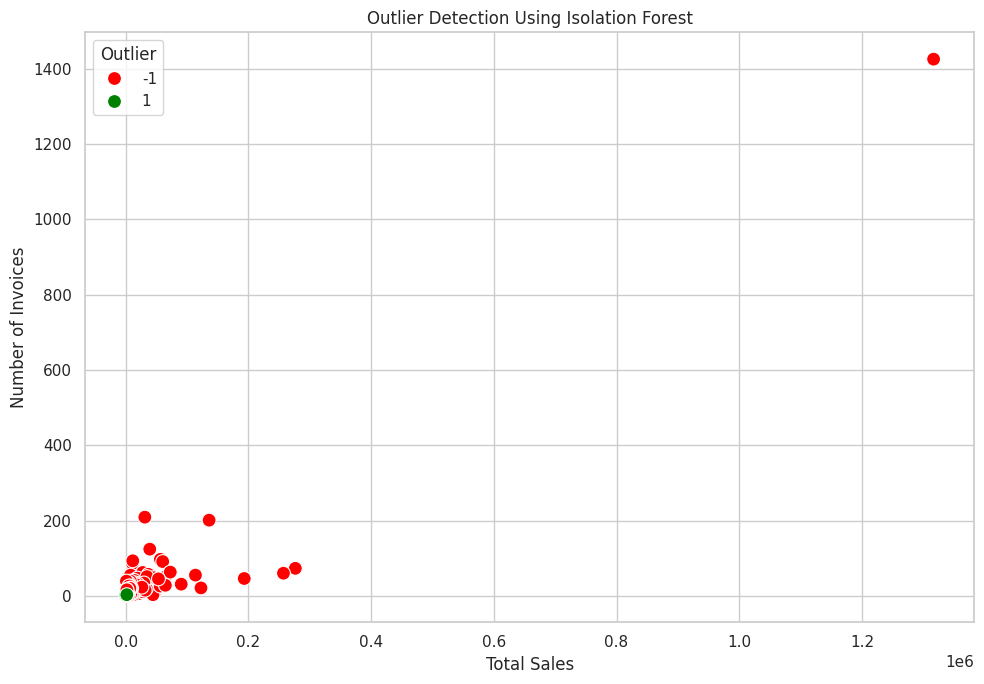

In [ ]:
from sklearn.ensemble import IsolationForest
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Assuming df contains 'CustomerID', 'TotalSales', and 'InvoiceNo'
E_Commerce_df_new = E_Commerce_df_copy.copy()
# Calculate TotalSales
E_Commerce_df_new['TotalSales'] = E_Commerce_df_new['Quantity'] * E_Commerce_df_new['UnitPrice']

# Aggregate customer data
customer_spend = E_Commerce_df_new.groupby('CustomerID').agg({
    'TotalSales': 'sum',
    'InvoiceNo': 'nunique'
}).reset_index()

# Isolation Forest for Outlier Detection
iso_forest = IsolationForest(contamination=0.05, random_state=42)
customer_spend['Outlier'] = iso_forest.fit_predict(customer_spend[['TotalSales', 'InvoiceNo']])

# Visualize Outliers
plt.figure(figsize=(10, 7))
sns.scatterplot(
    x='TotalSales',
    y='InvoiceNo',
    hue='Outlier',
    data=customer_spend,
    palette={1: 'green', -1: 'red'},
    s=100
)
plt.title("Outlier Detection Using Isolation Forest")
plt.xlabel("Total Sales")
plt.ylabel("Number of Invoices")
plt.legend(title="Outlier")
plt.tight_layout()
# Save as png
plt.savefig('16.1_outlier_detection_using_isolation_forest.png')
plt.show()

In [ ]:
# Plot Scatter using PX
fig = px.scatter(
    customer_spend,
    x='TotalSales',
    y='InvoiceNo',
    color='Outlier',
    color_discrete_map={1: 'green', -1: 'red'},
    title='Outlier Detection Using Isolation Forest',
    labels={'TotalSales': 'Total Sales', 'InvoiceNo': 'Number of Invoices'}
)
fig.update_layout(
    xaxis_title='Total Sales',
    yaxis_title='Number of Invoices',
    legend_title='Outlier'
)
# Save as html
fig.write_html('16.1_outlier_detection_using_isolation_forest.html')
# Show the plot
fig.show()